# `fit_v5_all`: baryonification model, all 8 sims, `profiles_v5_10k.hdf5`

Same pipeline as `fit_v5_fgas.ipynb` (bin selection -> PCA -> analytic (log M, z) model ->
bootstrap-error diagnostics), run here on **all 8 sims** instead of just the 4 pure
`fgas±Nσ` runs -- for direct comparison against the fgas-only fit. `Mstar-1sigma`
(different subgrid mechanism -- SN feedback, not AGN) and `Jet`/`Jet_fgas-4sigma` (different
feedback injection mechanism -- kinetic, not thermal) are included here, unlike in
`fit_v5_fgas.ipynb`; see that notebook's intro for why they were excluded there.

**PCA components: 3, not 4** -- PC4 was checked extensively in earlier work and found
negligible everywhere (<1% of variance, within-sim mean 5-10x smaller than its own scatter).

**Model, per sim (13 params total)** -- same functional forms as `fit_v5_fgas.ipynb`, reused
as-is (this is the comparison point: same model, different sim scope). PC2's two widths
(baseline-transition and bump) were found to be statistically indistinguishable -- tying them
saves a full parameter for essentially no cost (see `fit_v5_fgas.ipynb`'s intro for the numbers):

- `PC1(logM, z) = A * tanh[(M0(z) - logM) / w]`, `M0(z) = m0 + m1*z` -- 4 params
- `PC2(logM, z) = L_lo + (L_hi-L_lo)/2 * (1 + tanh[(logM-M2(z))/w]) + H * exp(-[(logM-M2(z))/w]^2)`,
  `M2(z) = m0_2 + m1_2*z` -- 6 params (shared width `w`)
- `PC3(logM, z) = c0 + c1*(logM-13.5) + c2*z` -- 3 params, plain least squares

Known going in: `Mstar-1sigma` fit poorly in earlier work with this same model (PC1 R2~0.52,
PC2 R2~0.66) -- kept here rather than re-tuned, specifically so the fit-quality table below
shows the real cost of pooling all 8 sims into one PCA basis instead of the clean 4-sim axis.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
plt.rcParams.update({
    "font.size": 16, "axes.titlesize": 18, "axes.labelsize": 16,
    "legend.fontsize": 13, "xtick.labelsize": 13, "ytick.labelsize": 13,
    "figure.titlesize": 20, "figure.dpi": 110,
})
import h5py
from sklearn.decomposition import PCA
from scipy.optimize import curve_fit

In [2]:
PATH = "/Users/jpaine/Desktop/Flamingo/"
SNAP_Z = {9:5.,13:4.,17:3.,37:2.,47:1.5,57:1.,62:.75,67:.5,69:.4,71:.3,73:.2,75:.1,77:0.}
SIMS = ["fgas+2sigma", "fgas-2sigma", "fgas-4sigma", "fgas-8sigma",
        "Mstar-1sigma", "Mstar-1sigma_fgas-4sigma", "Jet", "Jet_fgas-4sigma"]

f5 = h5py.File(f"{PATH}profiles_v5_10k.hdf5", "r")
n5 = sum(len(f5[s][sim]) for s in f5 for sim in f5[s])
print(f"v5: {n5} bins across {sum(1 for s in f5 for sim in f5[s])} snap/sim combos")

v5: 4160 bins across 104 snap/sim combos


## Bin selection

A bin is kept if `status=="ok"`, `ot_reliable` is `True` (resolved down to `r/R200c <~ 0.15` --
guarantees every kept curve covers `[0.15, 4.85]`, safe for the common-grid interpolation
below), and: low-mass bins (below where the NMAX=10000 cap stops binding, per snap/sim) need
`n_halos >= 10000`; high-mass bins need only `n_halos >= 100` (a flat 10k floor is infeasible
there -- even z=0's top bin only reaches ~9600 halos -- but a much lower floor still guards
against the handful of bins with just 2-3 halos).

In [3]:
def peak_capped_mass(f, snap, sim, nmax=10000):
    los = [f[snap][sim][k].attrs["lo"] for k in f[snap][sim]
           if f[snap][sim][k].attrs.get("status") == "ok"
           and f[snap][sim][k].attrs.get("n_halos") == nmax]
    return max(los) if los else -np.inf

def select_bins(f=f5, sims=SIMS, nmin_low_mass=10000, nmin_high_mass=100):
    rows = []
    for snap in f:
        z = SNAP_Z.get(int(snap))
        if z is None:
            continue
        for sim in sims:
            if sim not in f[snap]:
                continue
            peak = peak_capped_mass(f, snap, sim)
            for key in f[snap][sim]:
                g = f[snap][sim][key]
                if g.attrs.get("status") != "ok" or not g.attrs.get("ot_reliable", False):
                    continue
                lo, hi, n = g.attrs["lo"], g.attrs["hi"], g.attrs["n_halos"]
                if not (n >= nmin_low_mass or (lo > peak and n >= nmin_high_mass)):
                    continue
                rows.append(dict(
                    sim=sim, snap=snap, z=z, lo=float(lo), hi=float(hi), logM=float(lo + hi) / 2,
                    n_halos=int(n), capped=bool(n == g.attrs["nmax"]),
                    rc=g["rc"][...], ot_amp=g["ot"][...] - g["rc"][...],
                ))
    return rows

bins_ = select_bins()
meta_preview = pd.DataFrame(bins_)[["sim", "snap", "z", "logM", "n_halos", "capped"]]
print(f"{len(bins_)} bins pass the cut (of {n5} total in v5)")
meta_preview.groupby("sim").size()

1519 bins pass the cut (of 4160 total in v5)


sim
Jet                         187
Jet_fgas-4sigma             190
Mstar-1sigma                190
Mstar-1sigma_fgas-4sigma    191
fgas+2sigma                 190
fgas-2sigma                 190
fgas-4sigma                 191
fgas-8sigma                 190
dtype: int64

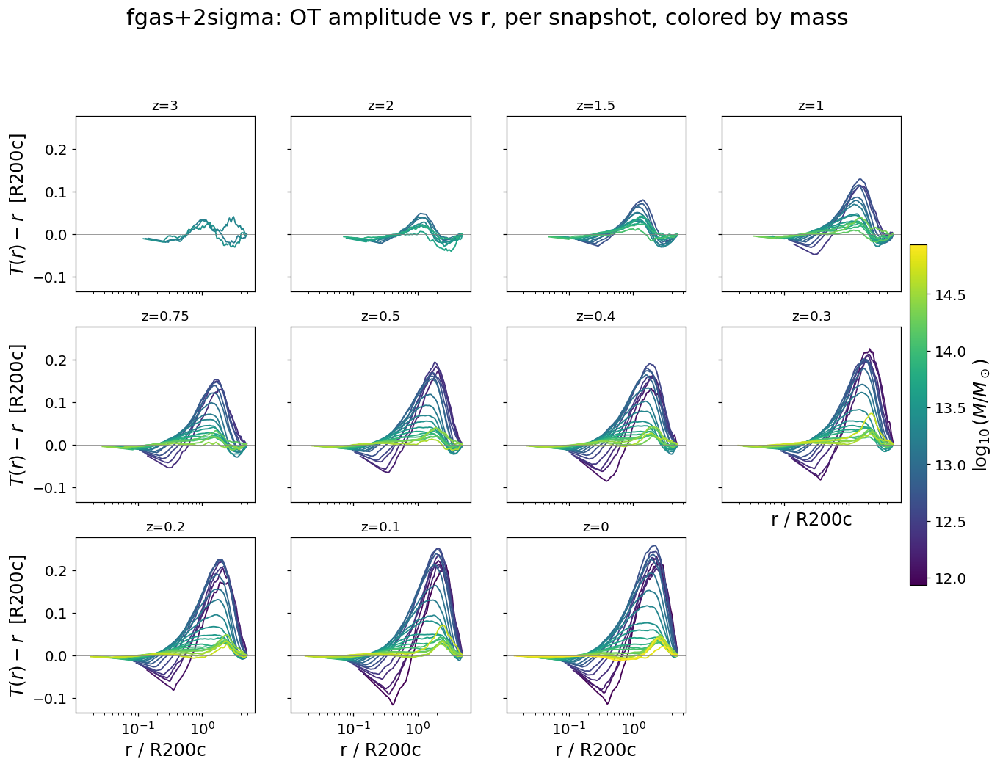

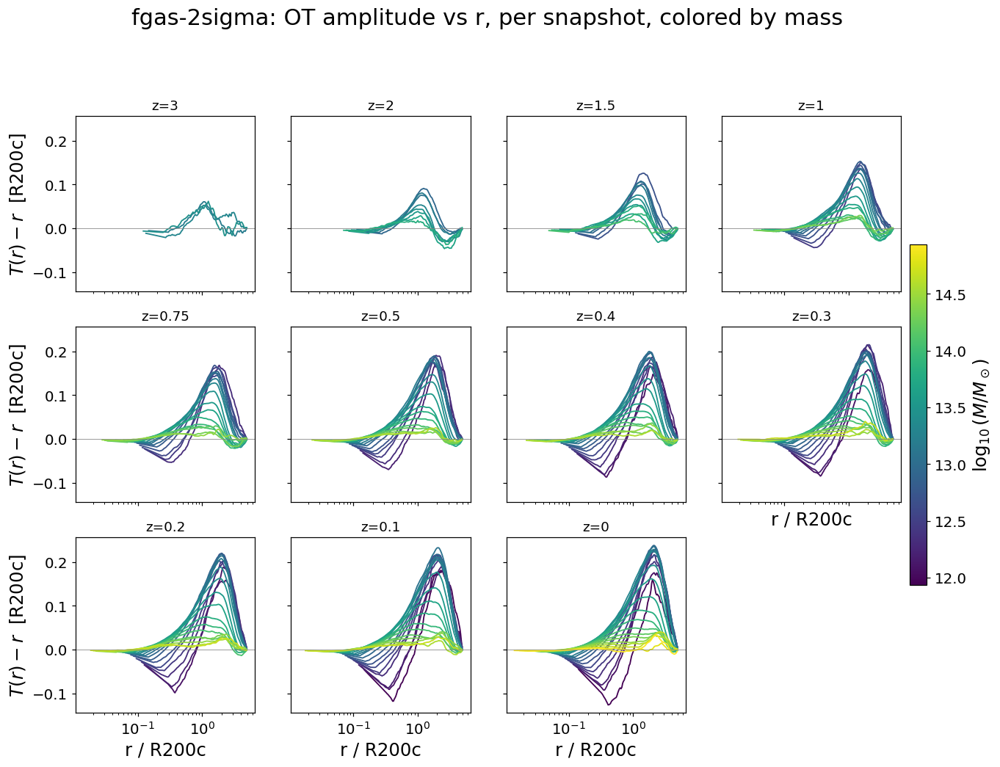

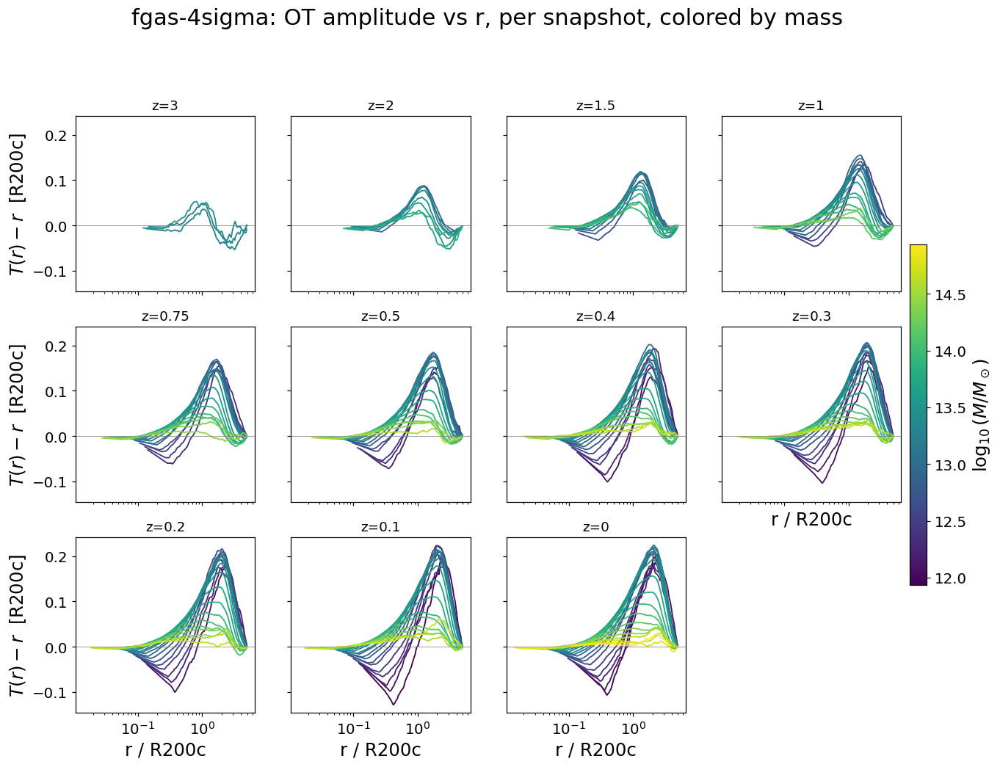

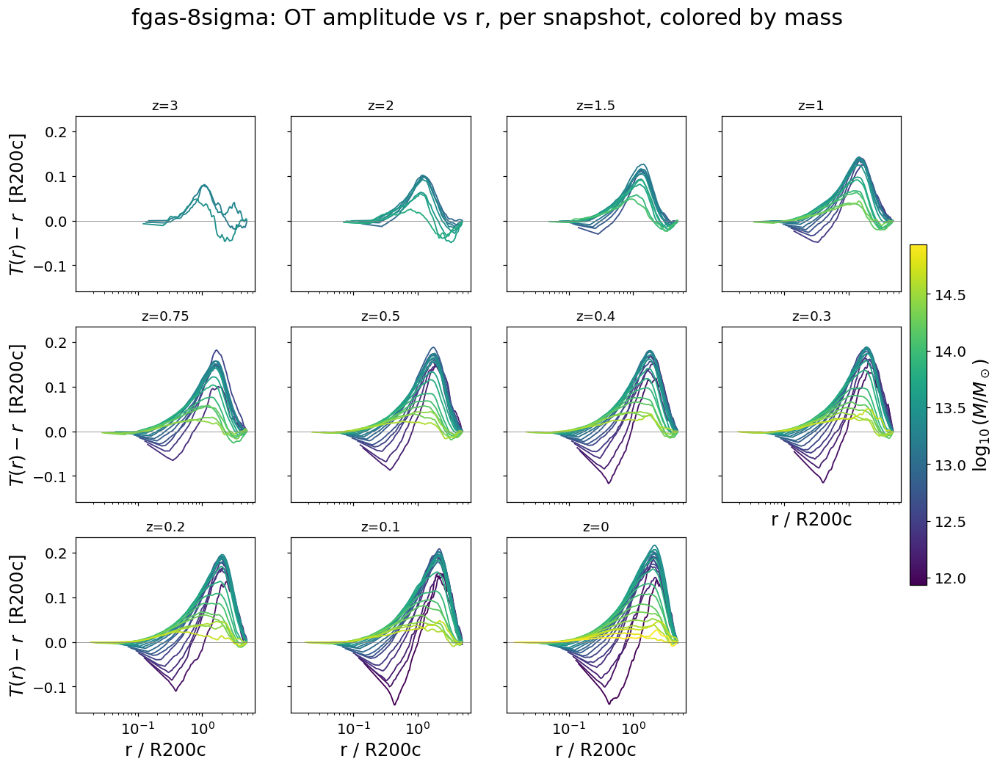

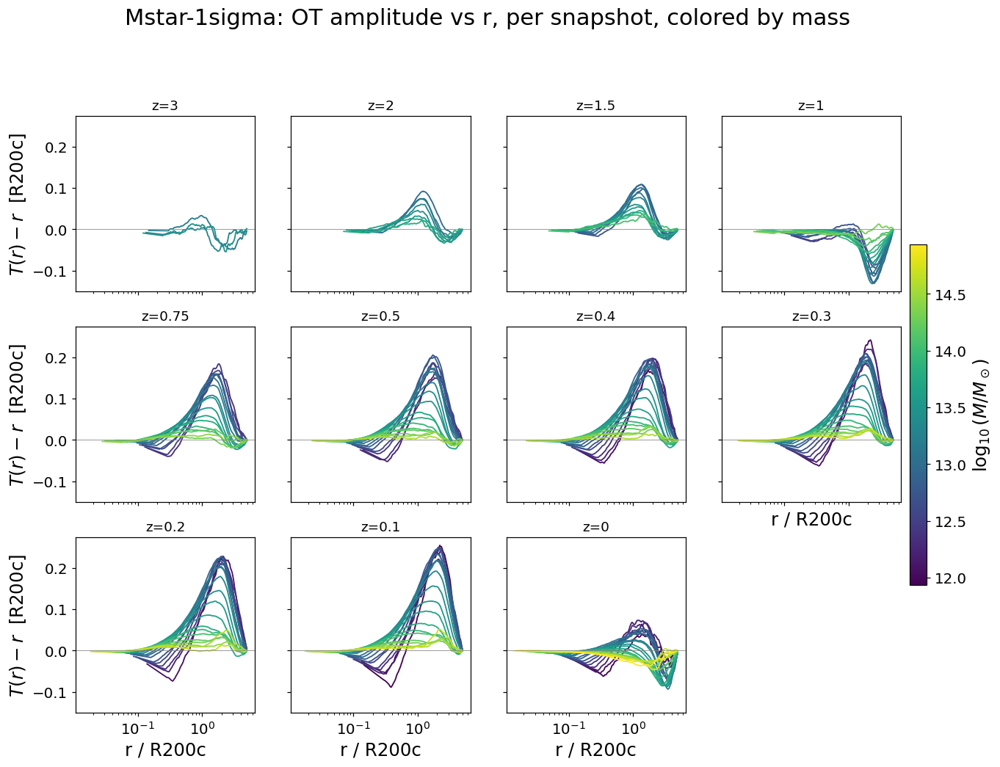

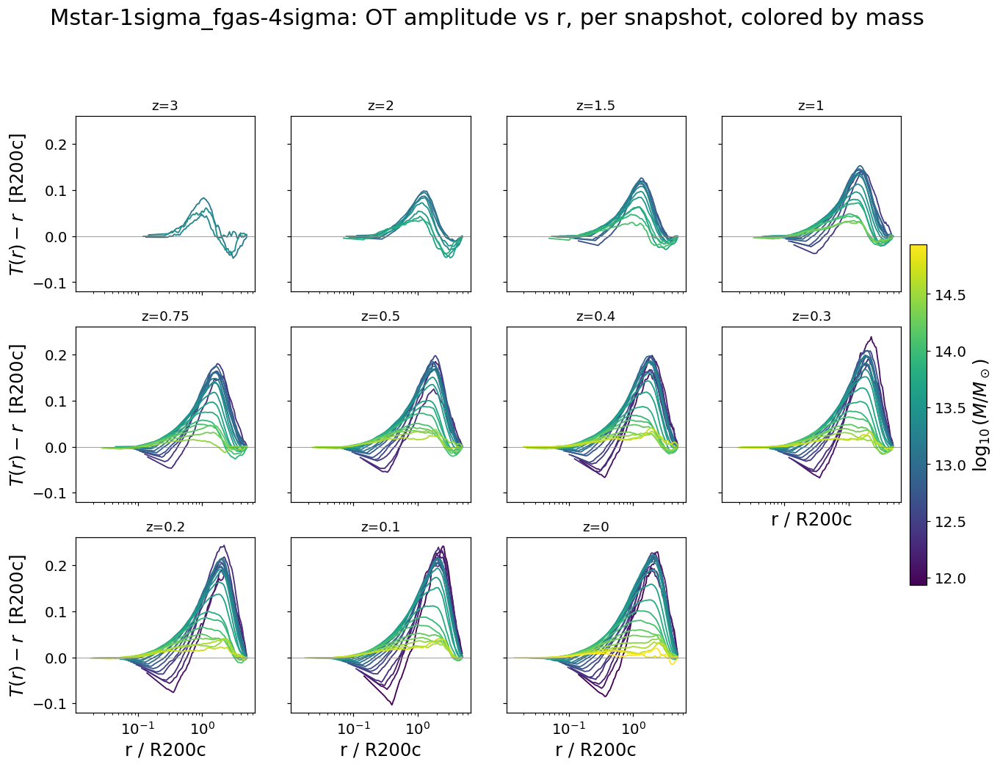

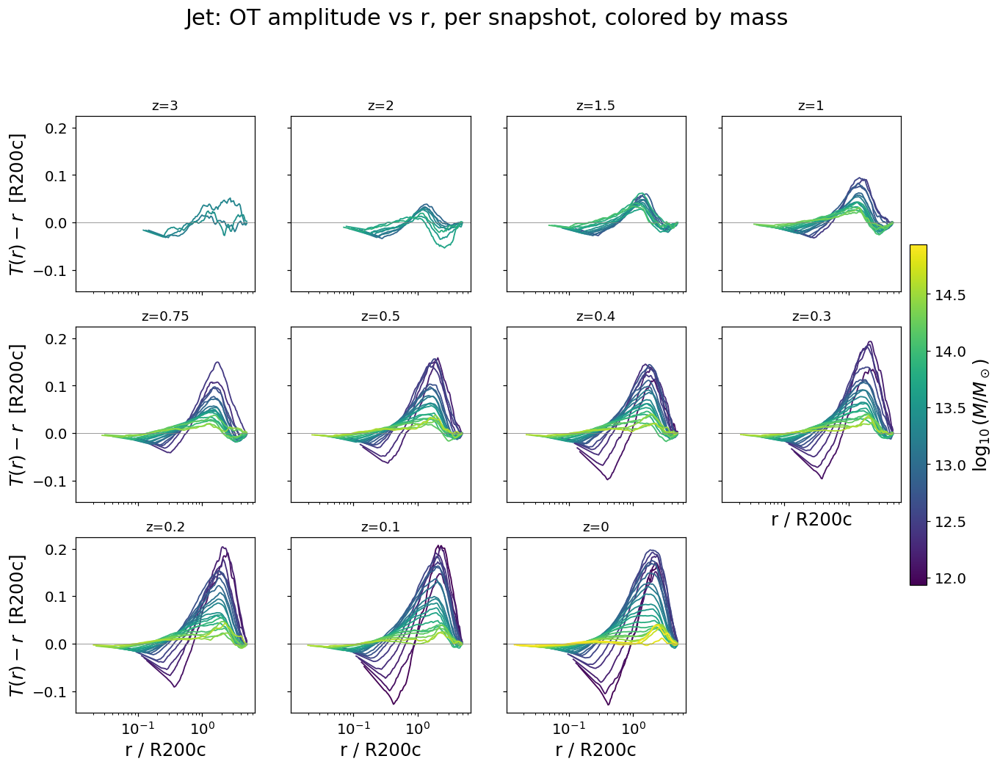

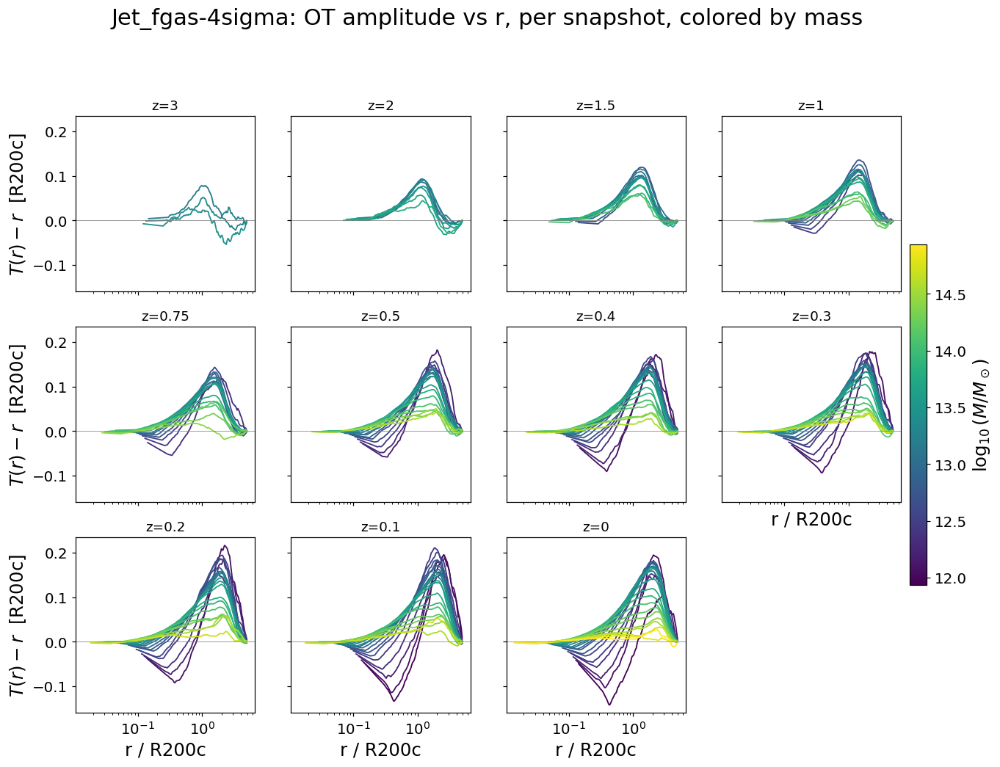

In [4]:
# per sim: one panel per snapshot, mass bins colored by logM
def plot_sim_grid_by_snap(sim, bins_=bins_, ncols=4):
    snaps = sorted({b["snap"] for b in bins_ if b["sim"] == sim}, key=lambda s: -SNAP_Z[int(s)])
    if not snaps:
        print(f"no bins for {sim}"); return
    logM_all = [b["logM"] for b in bins_ if b["sim"] == sim]
    norm = mpl.colors.Normalize(vmin=min(logM_all), vmax=max(logM_all))
    cmap = mpl.cm.viridis

    nrows = int(np.ceil(len(snaps) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.4*ncols, 3.2*nrows), sharex=True, sharey=True)
    axes = np.atleast_1d(axes).ravel()
    for ax, snap in zip(axes, snaps):
        rows = [b for b in bins_ if b["sim"] == sim and b["snap"] == snap]
        for b in sorted(rows, key=lambda b: b["logM"]):
            ax.plot(b["rc"], b["ot_amp"], color=cmap(norm(b["logM"])), lw=1.2)
        ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
        ax.set_title(f"z={SNAP_Z[int(snap)]:g}", fontsize=12)
    for ax in axes[len(snaps):]:
        ax.axis("off")
    for ax in axes[max(0, len(snaps)-ncols):len(snaps)]:
        ax.set_xlabel("r / R200c")
    for ax in axes[0:len(snaps):ncols]:
        ax.set_ylabel(r"$T(r)-r$  [R200c]")
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    fig.colorbar(sm, ax=axes[:len(snaps)], pad=0.01, fraction=0.02, label=r"$\log_{10}(M/M_\odot)$")
    fig.suptitle(f"{sim}: OT amplitude vs r, per snapshot, colored by mass", y=1.02)
    plt.show()

for sim in SIMS:
    plot_sim_grid_by_snap(sim)

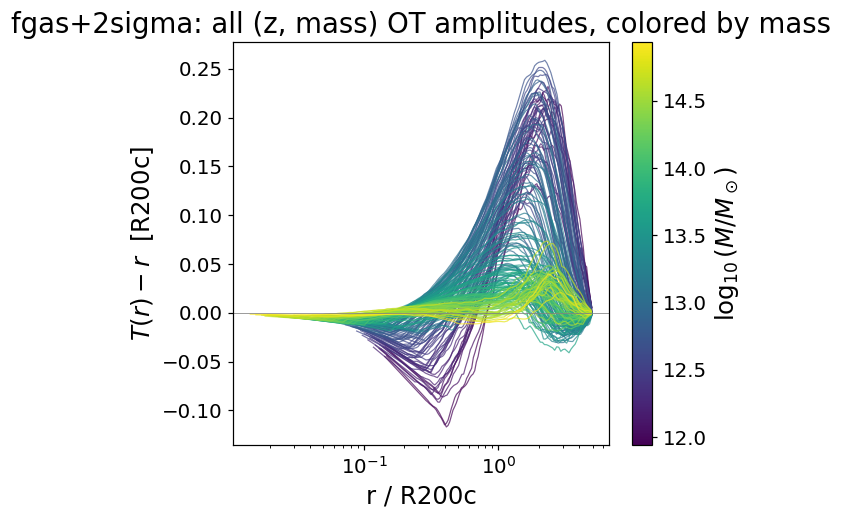

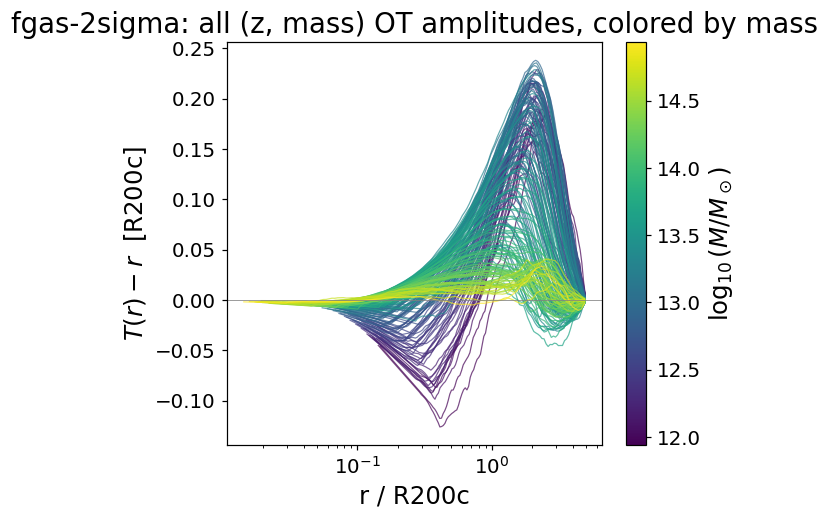

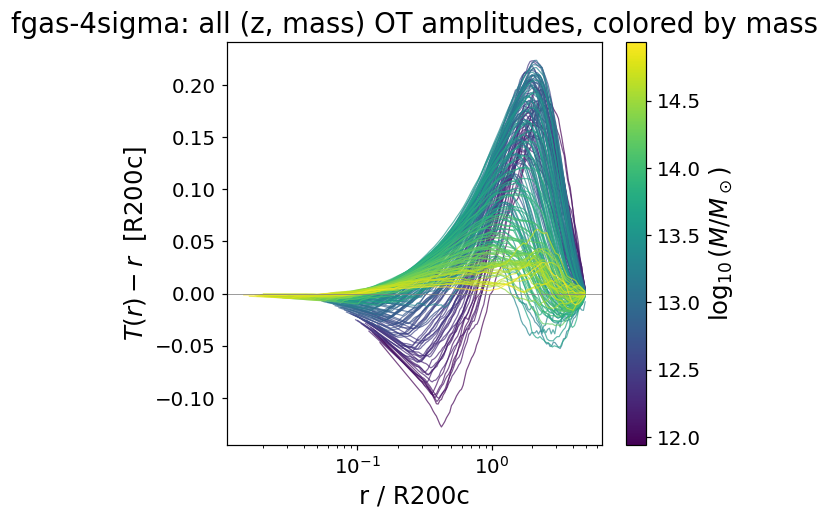

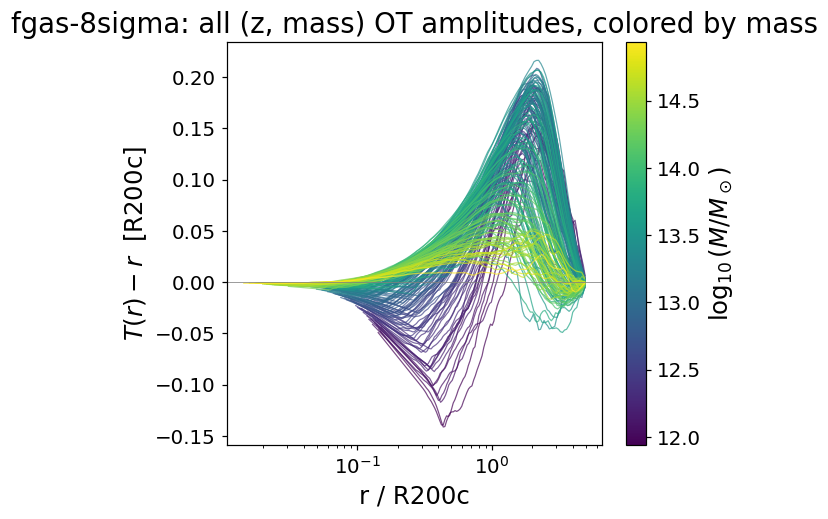

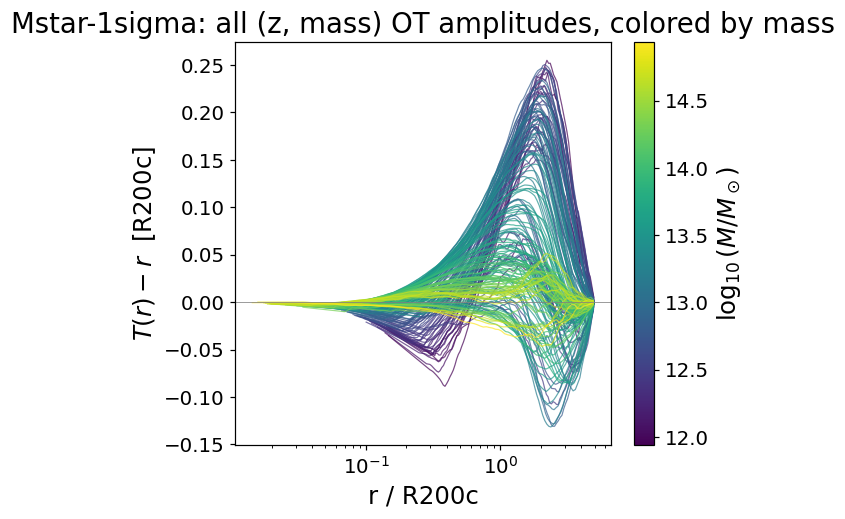

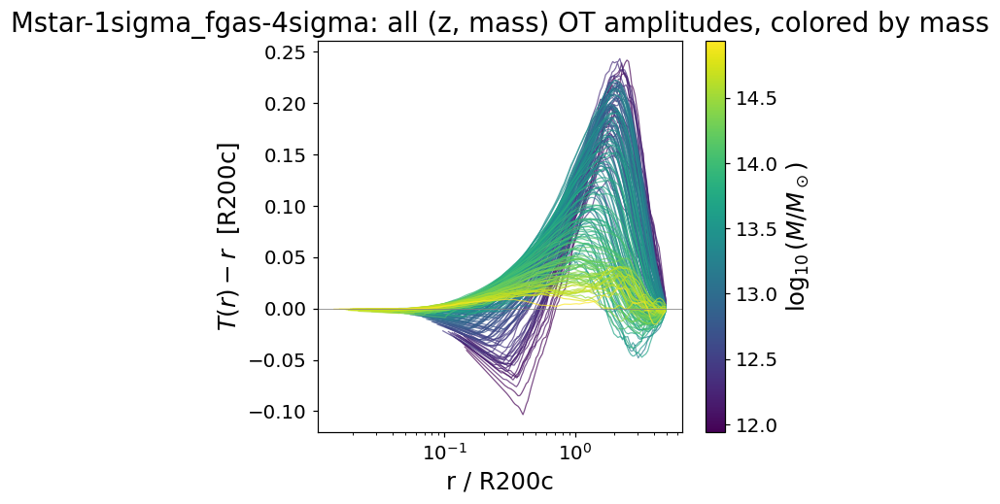

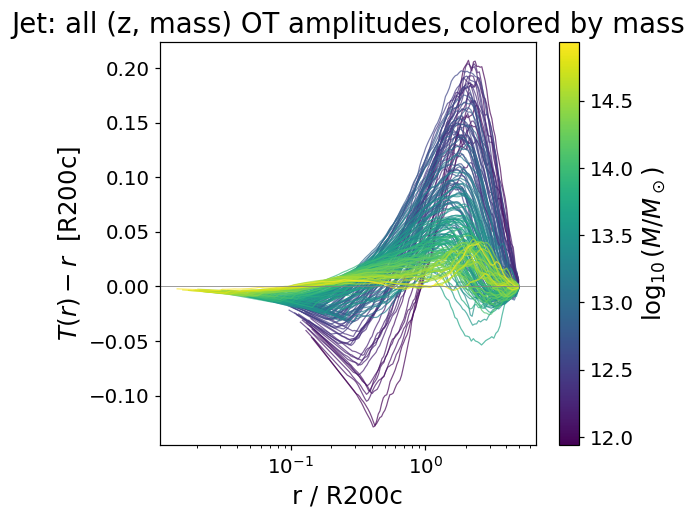

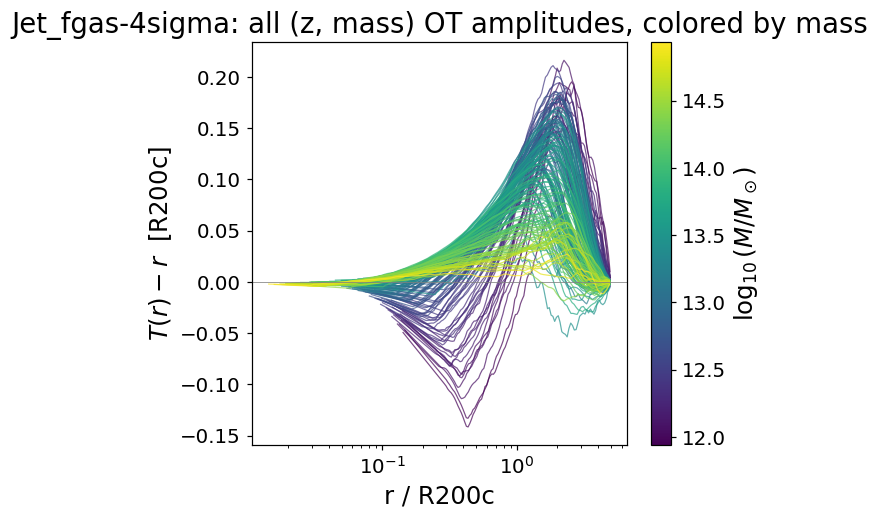

In [5]:
# per sim: single panel, every (z, mass) curve overlaid, colored by mass only
def plot_sim_overlay(sim, bins_=bins_):
    rows = [b for b in bins_ if b["sim"] == sim]
    if not rows:
        print(f"no bins for {sim}"); return
    logM_all = [b["logM"] for b in rows]
    norm = mpl.colors.Normalize(vmin=min(logM_all), vmax=max(logM_all))
    cmap = mpl.cm.viridis

    fig, ax = plt.subplots(figsize=(6, 5))
    for b in sorted(rows, key=lambda b: b["logM"]):
        ax.plot(b["rc"], b["ot_amp"], color=cmap(norm(b["logM"])), lw=0.8, alpha=.7)
    ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
    ax.set_xlabel("r / R200c"); ax.set_ylabel(r"$T(r)-r$  [R200c]")
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    fig.colorbar(sm, ax=ax, label=r"$\log_{10}(M/M_\odot)$")
    ax.set_title(f"{sim}: all (z, mass) OT amplitudes, colored by mass")
    plt.tight_layout(); plt.show()

for sim in SIMS:
    plot_sim_overlay(sim)

## PCA of the OT amplitude, 3 components, fit globally across all 8 sims

Each kept bin has its own native `rc` grid (inner cutoff set by particle resolution). Since the
`ot_reliable` cut guarantees every kept curve covers `r/R200c in [0.15, 4.85]`, that range is
used as a common grid: each curve is linearly interpolated in `log(r)` onto it, then all
sims/z/mass are stacked into one matrix and a 3-component PCA is fit -- one shape basis shared
across all 8 sims, including the two different sub-grid mechanisms `Mstar-1sigma` and `Jet`.

In [6]:
R_GRID = np.geomspace(0.15, 4.85, 100)

def to_common_grid(b, r_grid=R_GRID):
    return np.interp(np.log(r_grid), np.log(b["rc"]), b["ot_amp"])

X = np.array([to_common_grid(b) for b in bins_])
meta = pd.DataFrame(bins_)[["sim", "snap", "z", "logM", "n_halos", "capped"]]

pca = PCA(n_components=3)
coeffs = pca.fit_transform(X)
for i in range(3):
    meta[f"pc{i+1}"] = coeffs[:, i]

print("explained variance ratio:", np.round(pca.explained_variance_ratio_, 4))
print("cumulative:", pca.explained_variance_ratio_.cumsum()[-1])
meta.head()

explained variance ratio: [0.754  0.2003 0.036 ]
cumulative: 0.9902262343872487


,sim,snap,z,logM,n_halos,capped,pc1,pc2,pc3
0,fgas+2sigma,17,3.0,13.1875,800,False,-0.467138,-0.135629,-0.065223
1,fgas+2sigma,17,3.0,13.3125,294,False,-0.355935,-0.206239,0.050500
2,fgas+2sigma,17,3.0,13.4375,145,False,-0.521929,-0.124494,-0.062193
3,fgas-2sigma,17,3.0,13.1875,792,False,-0.376162,-0.030505,-0.070409
4,fgas-2sigma,17,3.0,13.3125,288,False,-0.276185,-0.153087,0.004393


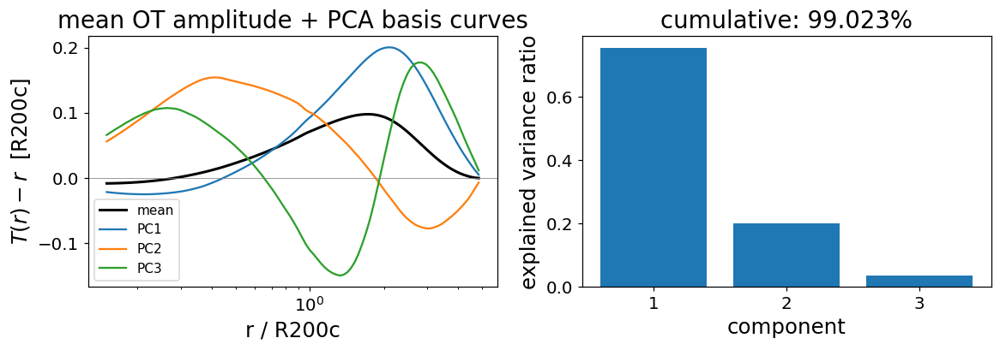

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(11, 4))
axes[0].plot(R_GRID, pca.mean_, "k-", lw=2, label="mean")
for i in range(3):
    axes[0].plot(R_GRID, pca.components_[i], lw=1.5, label=f"PC{i+1}")
axes[0].set_xscale("log"); axes[0].axhline(0, color="gray", lw=.5)
axes[0].set_xlabel("r / R200c"); axes[0].set_ylabel(r"$T(r)-r$  [R200c]")
axes[0].legend(fontsize=10); axes[0].set_title("mean OT amplitude + PCA basis curves")

axes[1].bar(range(1, 4), pca.explained_variance_ratio_)
axes[1].set_xticks(range(1, 4)); axes[1].set_xlabel("component"); axes[1].set_ylabel("explained variance ratio")
axes[1].set_title(f"cumulative: {pca.explained_variance_ratio_.cumsum()[-1]:.3%}")
plt.tight_layout(); plt.show()

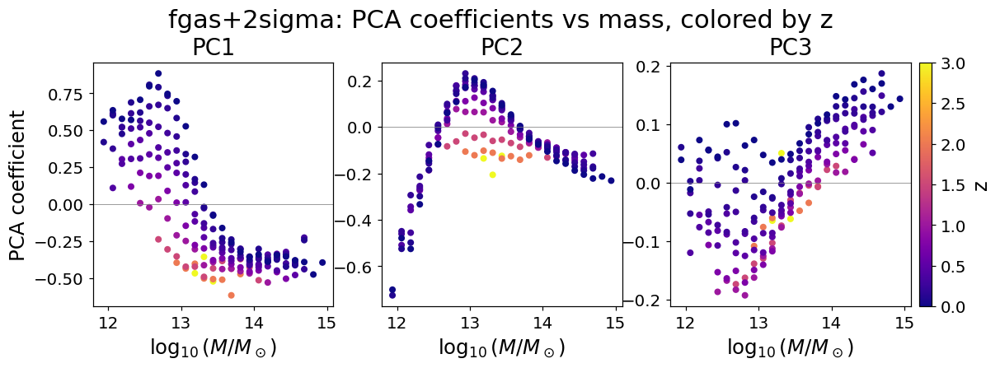

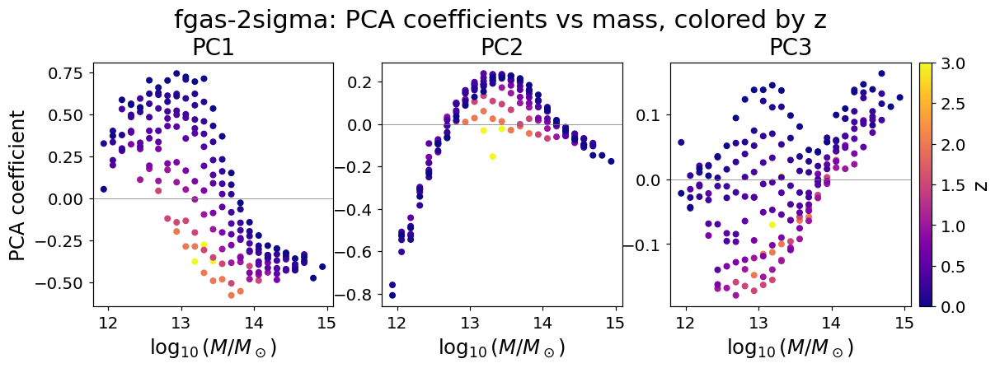

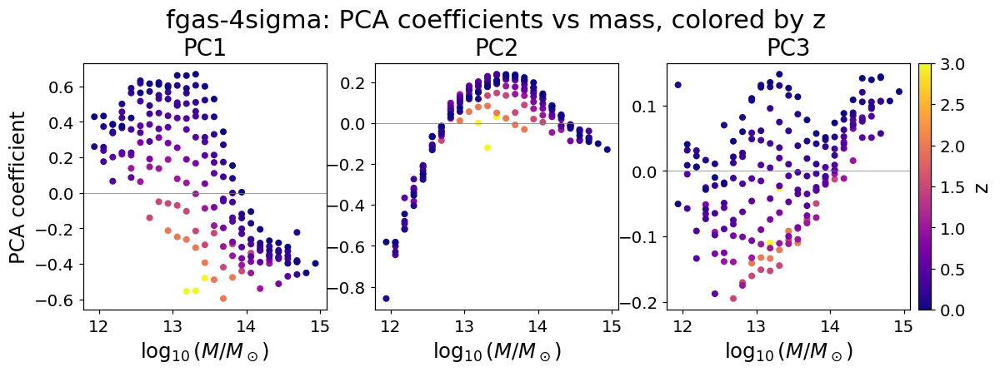

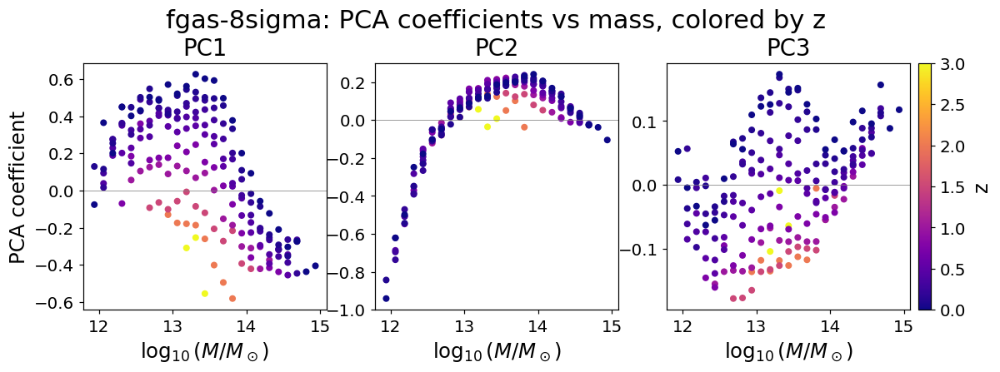

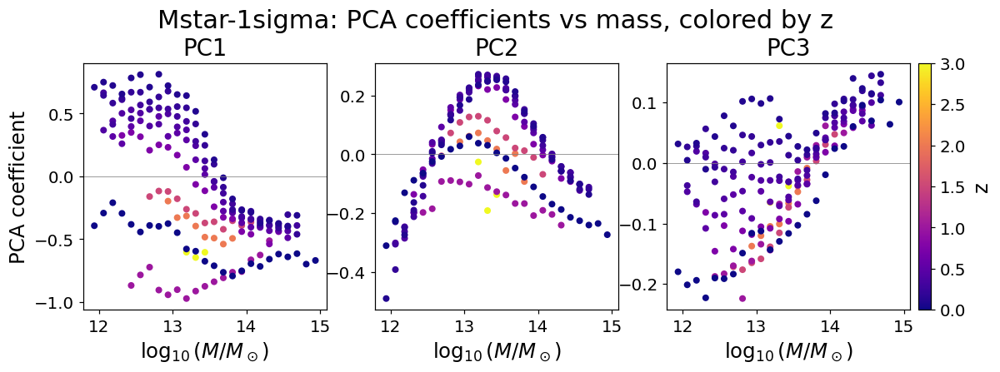

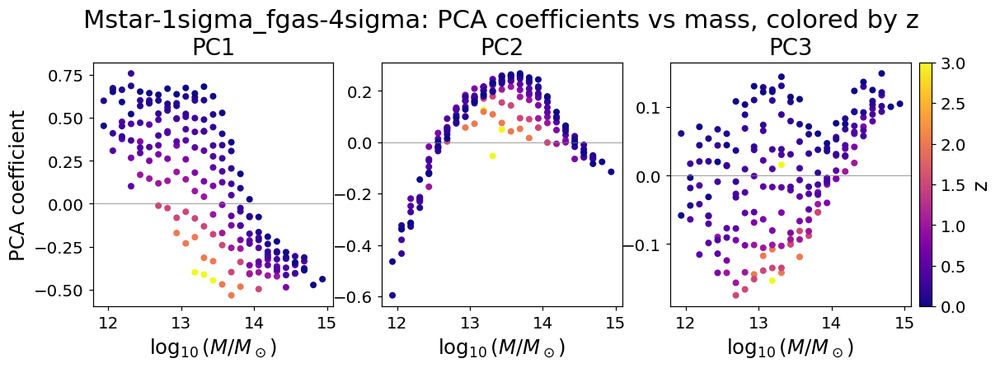

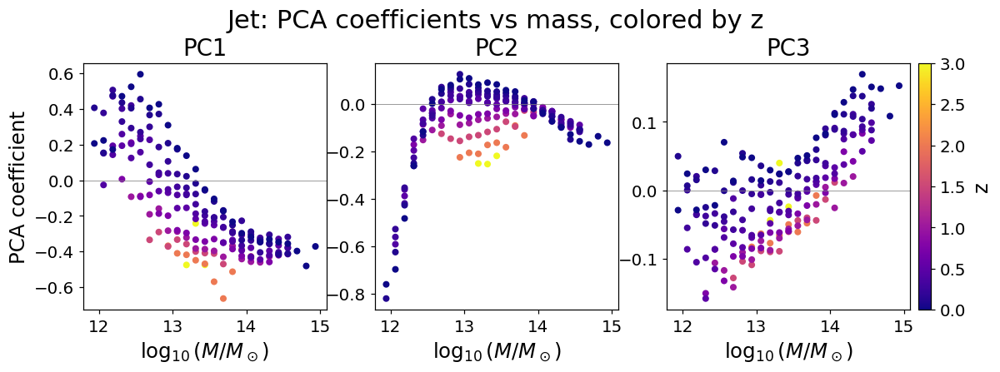

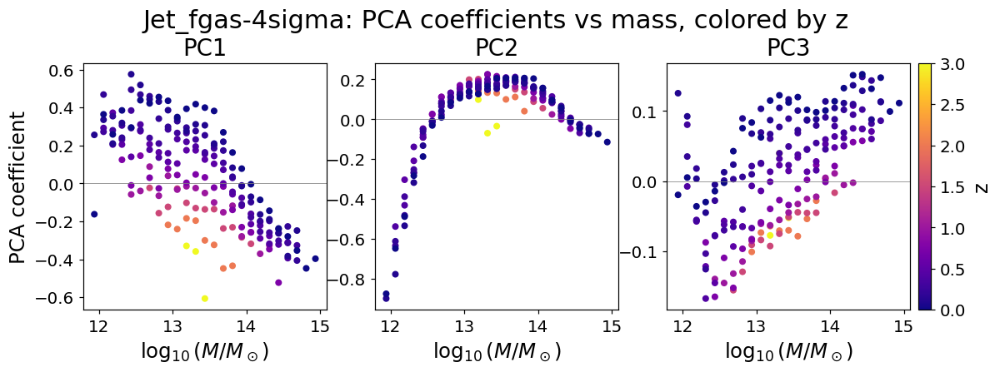

In [8]:
# per sim: how each of the 3 PCA coefficients varies with mass, colored by z
def plot_pca_vs_mz(sim, meta=meta):
    sub = meta[meta.sim == sim]
    if sub.empty:
        print(f"no bins for {sim}"); return
    norm = mpl.colors.Normalize(vmin=sub.z.min(), vmax=sub.z.max())
    cmap = mpl.cm.plasma
    fig, axes = plt.subplots(1, 3, figsize=(12, 3.5), sharex=True)
    for i, ax in enumerate(axes):
        sc = ax.scatter(sub.logM, sub[f"pc{i+1}"], c=sub.z, cmap=cmap, norm=norm, s=18)
        ax.set_xlabel(r"$\log_{10}(M/M_\odot)$"); ax.set_title(f"PC{i+1}")
        ax.axhline(0, color="gray", lw=.5)
    axes[0].set_ylabel("PCA coefficient")
    fig.colorbar(sc, ax=axes, pad=.01, fraction=.02, label="z")
    fig.suptitle(f"{sim}: PCA coefficients vs mass, colored by z", y=1.05)
    plt.show()

for sim in SIMS:
    plot_pca_vs_mz(sim)

## 13-parameter analytic model, per sim

- `PC1(logM, z) = A * tanh[(M0(z) - logM) / w]`, `M0(z) = m0 + m1*z` -- 4 params (A, w, m0, m1)
- `PC2(logM, z) = L_lo + (L_hi-L_lo)/2 * (1 + tanh[(logM-M2(z))/w]) + H * exp(-[(logM-M2(z))/w]^2)`,
  `M2(z) = m0_2 + m1_2*z` -- 6 params (m0_2, m1_2, L_lo, L_hi, w, H -- one shared width)
- `PC3(logM, z) = c0 + c1*(logM-13.5) + c2*z` -- 3 params, plain least squares

Total: **13 params/sim**, same form as `fit_v5_fgas.ipynb` -- fit independently per sim, so
`Mstar-1sigma`/`Jet` don't distort the fgas sims' own fits, but the shared PCA basis (fit
jointly across all 8) does absorb some of their different physics into PC1-3's shapes.

In [9]:
M_REF = 13.5

def pc1_fun(X, A, w, m0, m1):
    logM, z = X
    return A * np.tanh(((m0 + m1 * z) - logM) / w)

def pc2_fun(X, m0, m1, L_lo, L_hi, w, H):
    logM, z = X
    M2 = m0 + m1 * z
    baseline = L_lo + (L_hi - L_lo) / 2 * (1 + np.tanh((logM - M2) / w))
    bump = H * np.exp(-((logM - M2) / w) ** 2)
    return baseline + bump

def fit_pc3(logM, z, y):
    m = logM - M_REF
    D = np.column_stack([np.ones_like(m), m, z])
    coef, *_ = np.linalg.lstsq(D, y, rcond=None)
    return coef

def pc3_fun(logM, z, coef):
    m = logM - M_REF
    c0, c1, c2 = coef
    return c0 + c1 * m + c2 * z

def fit_sim(sim, meta=meta):
    sub = meta[meta.sim == sim]
    logM, z = sub.logM.values, sub.z.values
    y1, y2, y3 = sub.pc1.values, sub.pc2.values, sub.pc3.values

    A0 = (y1.max() - y1.min()) / 2
    p0_1 = [A0, 1.0, np.median(logM), -0.3]
    bounds_1 = ([-3, 0.02, 8, -5], [3, 10, 18, 5])
    popt1, _ = curve_fit(pc1_fun, (logM, z), y1, p0=p0_1, bounds=bounds_1, maxfev=50000)

    p0_2 = [np.median(logM), -0.3, y2.min(), 0.0, 0.5, y2.max() - y2.min()]
    bounds_2 = ([8, -5, -3, -3, 0.05, -3], [18, 5, 3, 3, 10, 3])
    popt2, _ = curve_fit(pc2_fun, (logM, z), y2, p0=p0_2, bounds=bounds_2, maxfev=50000)

    return dict(popt1=popt1, popt2=popt2, popt3=fit_pc3(logM, z, y3))

fits = {sim: fit_sim(sim) for sim in SIMS}

def predict_pcs(sim, logM, z):
    logM, z = np.atleast_1d(logM), np.atleast_1d(z)
    p1, p2, p3 = fits[sim]["popt1"], fits[sim]["popt2"], fits[sim]["popt3"]
    pc1 = pc1_fun((logM, z), *p1)
    pc2 = pc2_fun((logM, z), *p2)
    pc3 = pc3_fun(logM, z, p3)
    return np.stack([pc1, pc2, pc3], axis=1)

def predict_curve(sim, logM, z):
    return pca.inverse_transform(predict_pcs(sim, logM, z))[0]

rows = []
for sim in SIMS:
    sub = meta[meta.sim == sim]
    pcs_pred = predict_pcs(sim, sub.logM.values, sub.z.values)
    pcs_true = sub[["pc1", "pc2", "pc3"]].values
    X_true = X[meta.sim.values == sim]
    X_pred = pca.inverse_transform(pcs_pred)
    frac_var = 1 - np.sum((X_pred - X_true) ** 2) / np.sum((X_true - X_true.mean(axis=0)) ** 2)
    r2 = [1 - np.sum((pcs_true[:, i] - pcs_pred[:, i]) ** 2) / np.sum((pcs_true[:, i] - pcs_true[:, i].mean()) ** 2)
          for i in range(3)]
    rows.append(dict(sim=sim, r2_pc1=r2[0], r2_pc2=r2[1], r2_pc3=r2[2], frac_shape_var=frac_var))
pd.DataFrame(rows).round(3)

,sim,r2_pc1,r2_pc2,r2_pc3,frac_shape_var
0,fgas+2sigma,0.918,0.891,0.640,0.895
1,fgas-2sigma,0.916,0.944,0.594,0.903
2,fgas-4sigma,0.898,0.936,0.627,0.889
3,fgas-8sigma,0.836,0.946,0.595,0.850
4,Mstar-1sigma,0.524,0.665,0.452,0.531
5,Mstar-1sigma_fgas-4sigma,0.918,0.927,0.637,0.901
6,Jet,0.928,0.816,0.697,0.879
7,Jet_fgas-4sigma,0.847,0.950,0.666,0.862


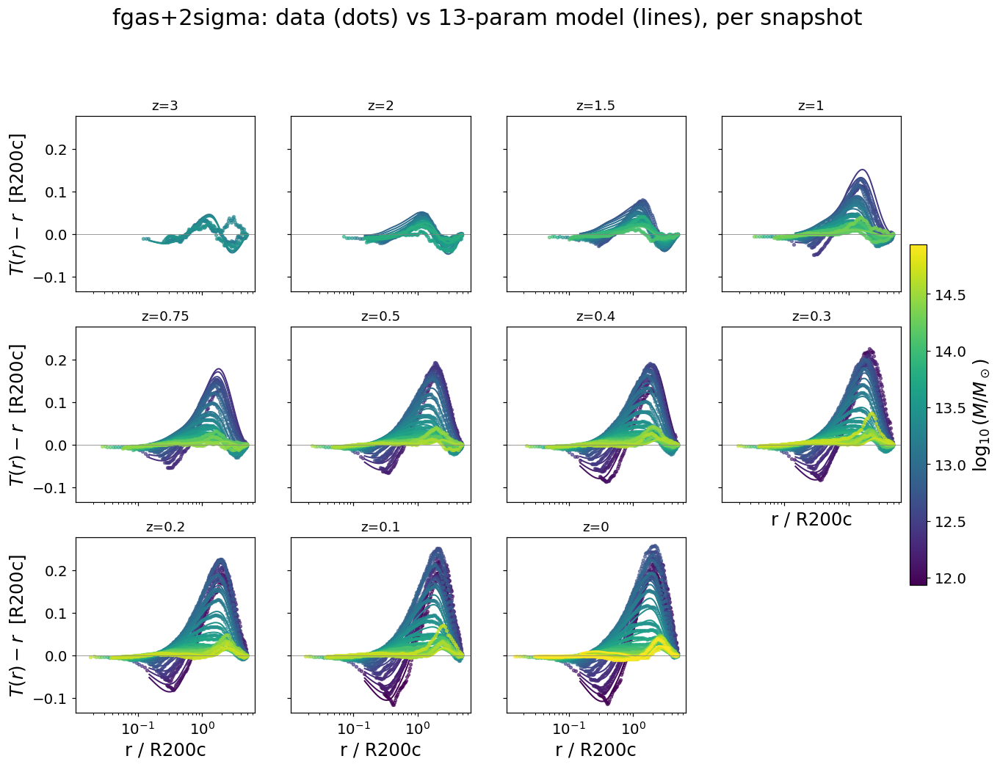

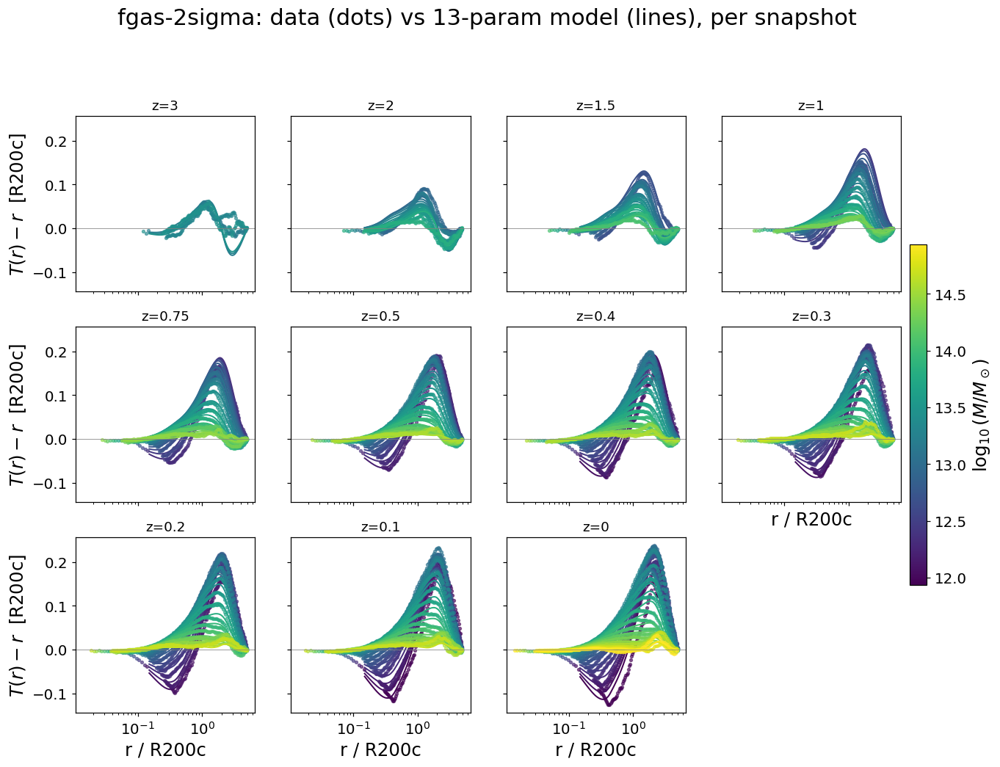

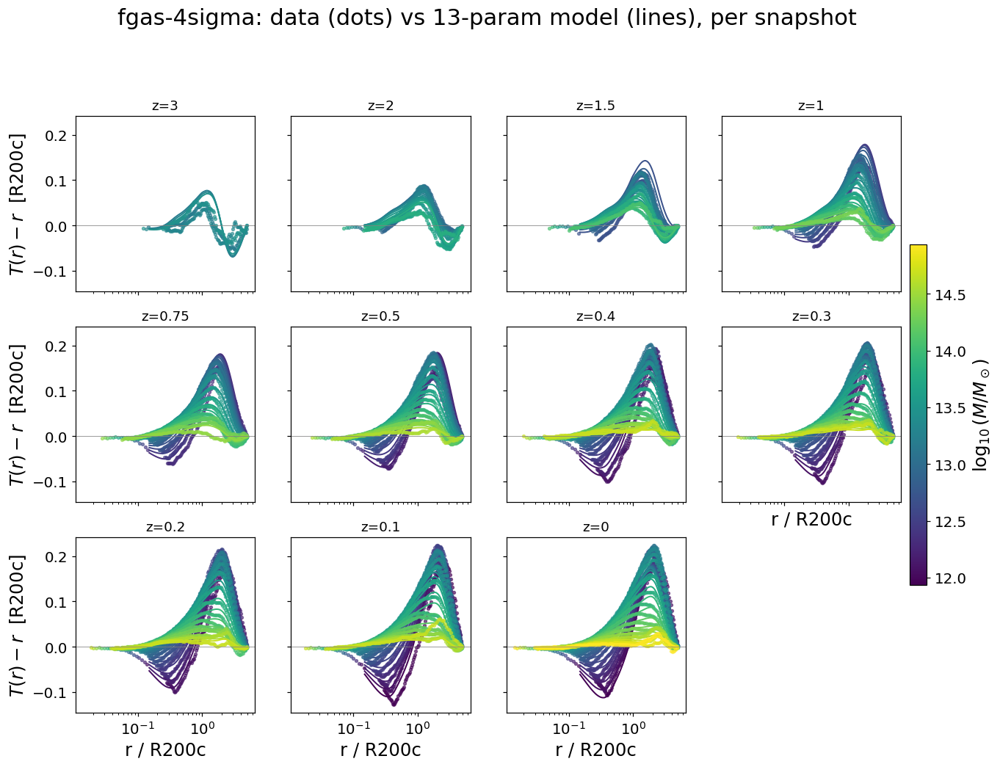

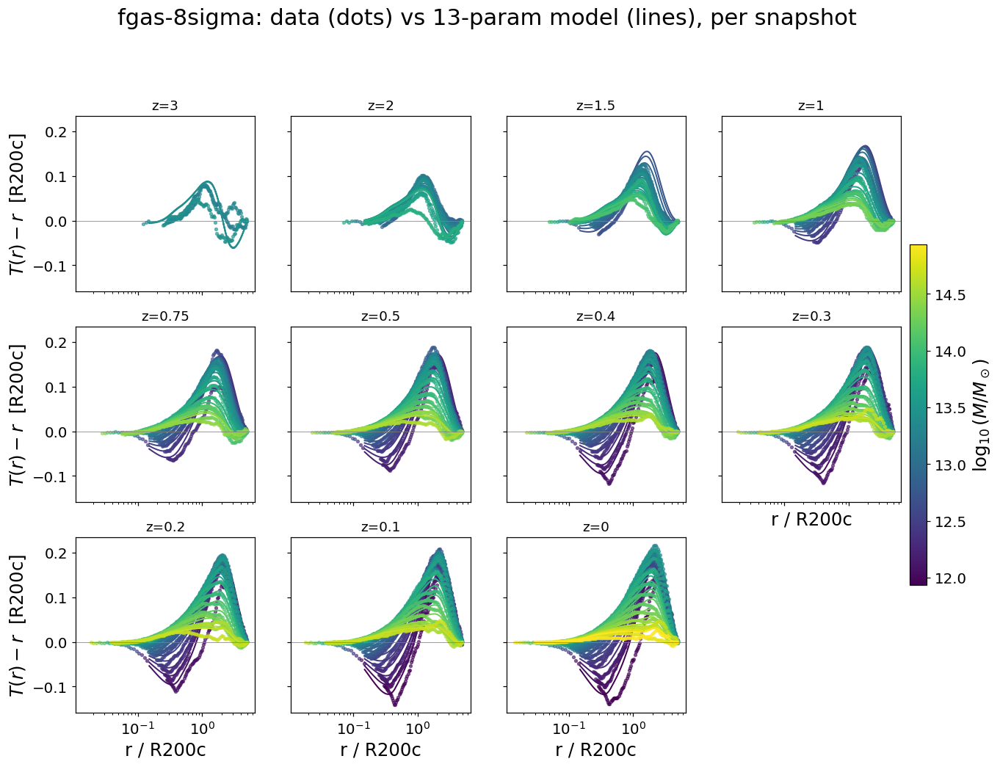

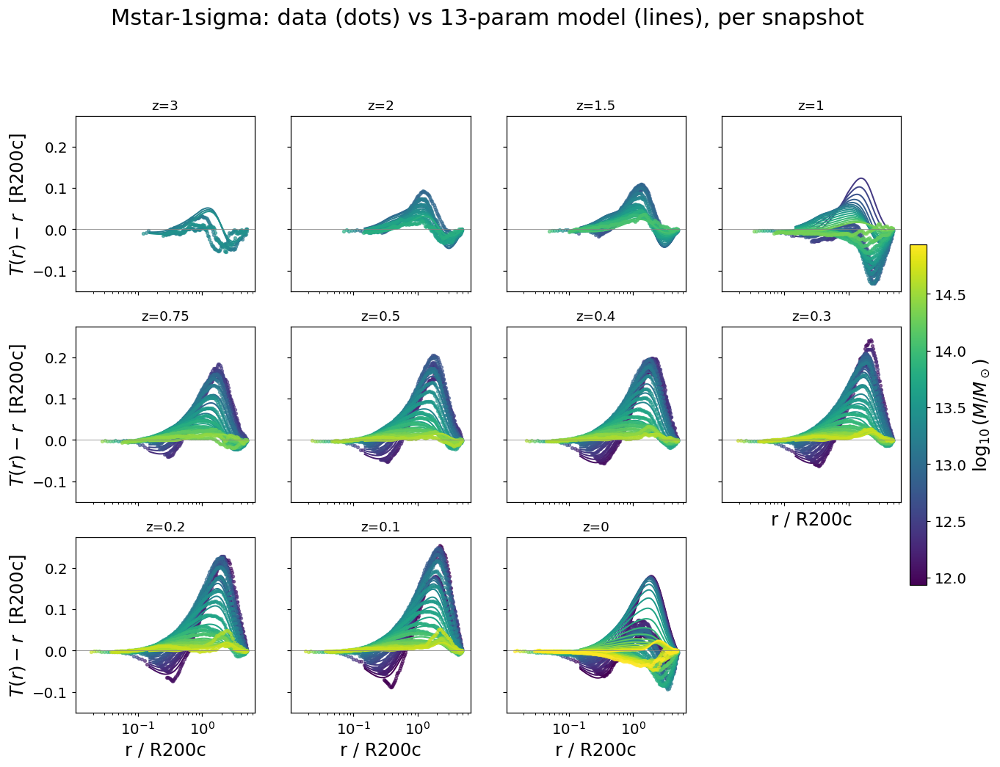

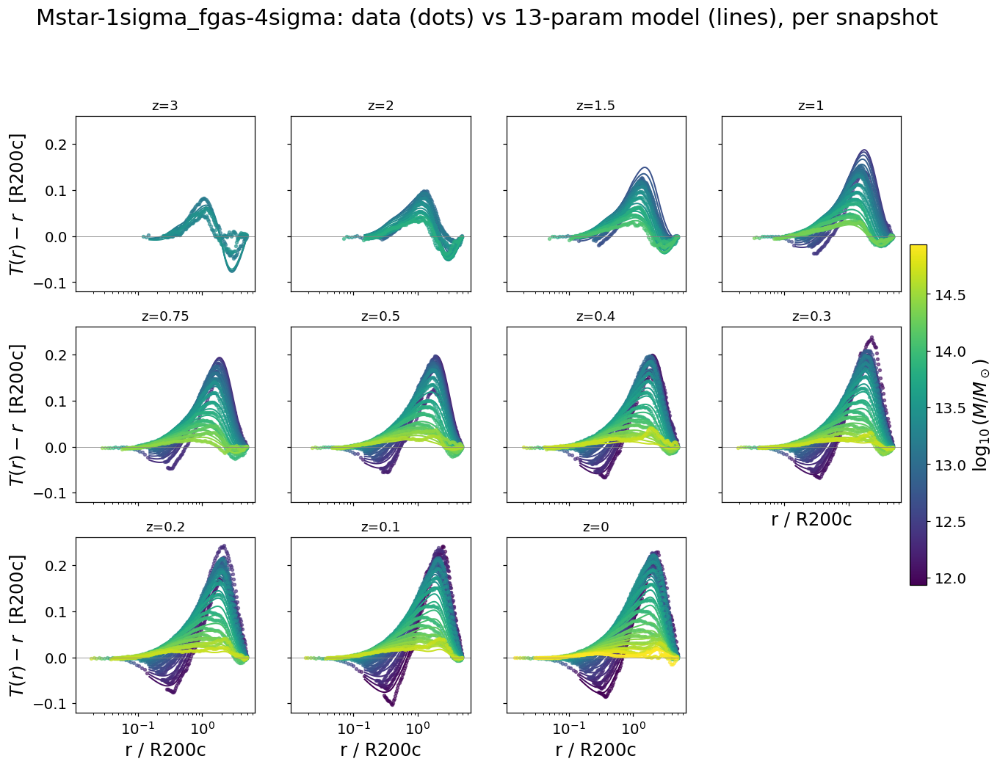

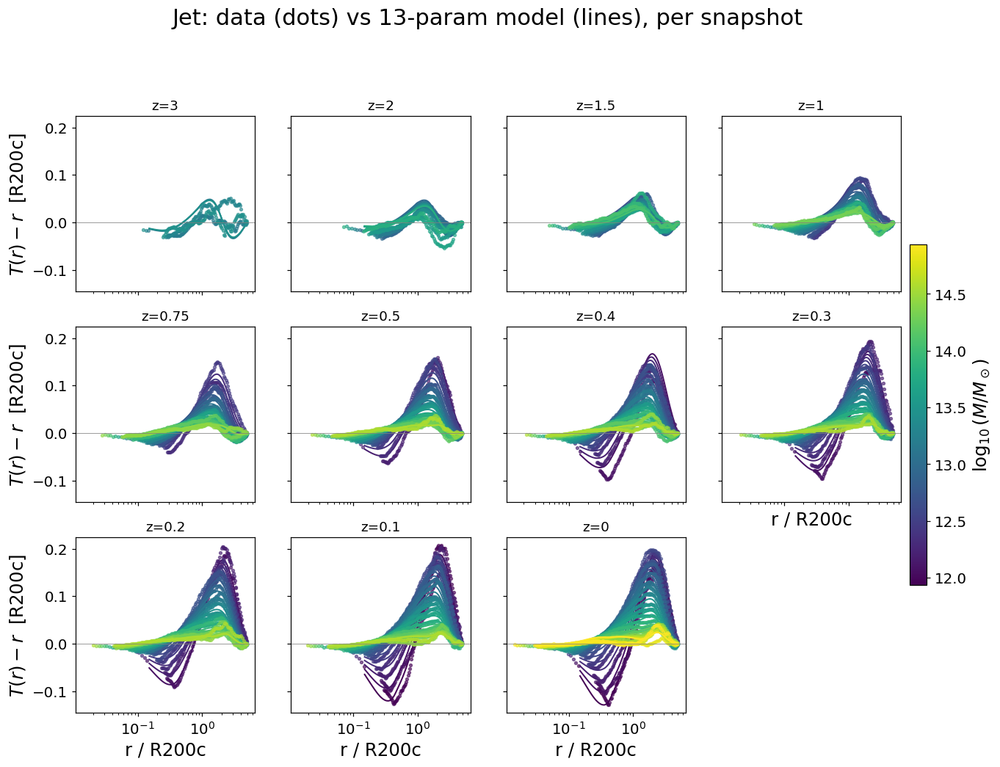

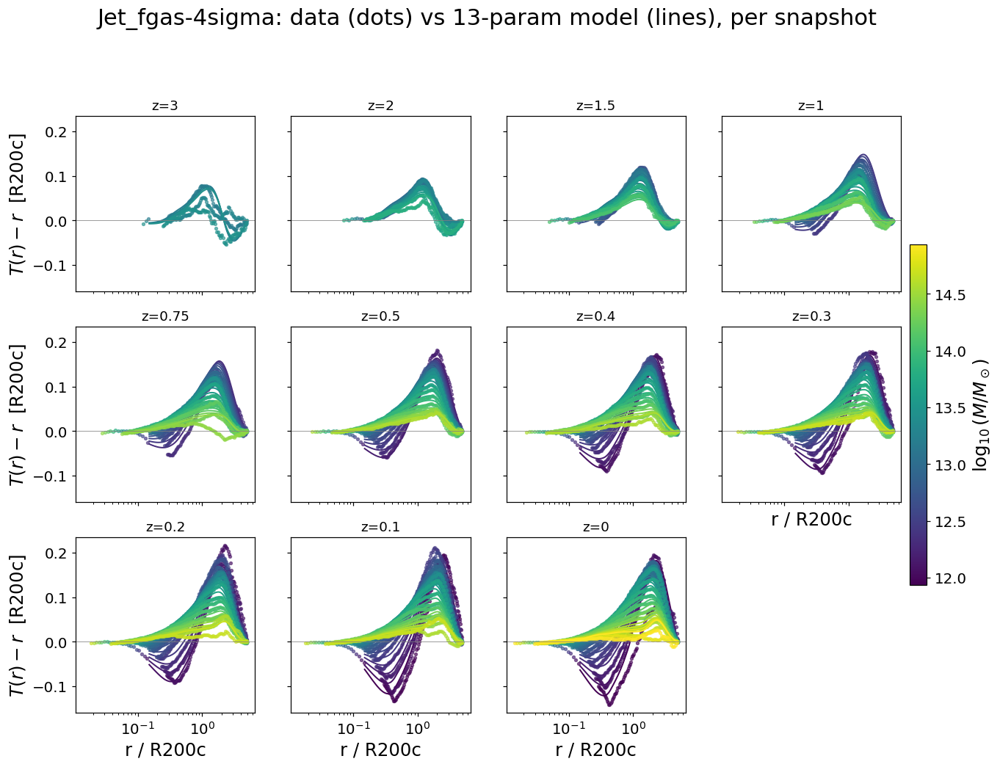

In [10]:
def plot_sim_grid_fit(sim, bins_=bins_, ncols=4):
    snaps = sorted({b["snap"] for b in bins_ if b["sim"] == sim}, key=lambda s: -SNAP_Z[int(s)])
    if not snaps:
        print(f"no bins for {sim}"); return
    logM_all = [b["logM"] for b in bins_ if b["sim"] == sim]
    norm = mpl.colors.Normalize(vmin=min(logM_all), vmax=max(logM_all))
    cmap = mpl.cm.viridis

    nrows = int(np.ceil(len(snaps) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.4*ncols, 3.2*nrows), sharex=True, sharey=True)
    axes = np.atleast_1d(axes).ravel()
    for ax, snap in zip(axes, snaps):
        rows = [b for b in bins_ if b["sim"] == sim and b["snap"] == snap]
        for b in sorted(rows, key=lambda b: b["logM"]):
            color = cmap(norm(b["logM"]))
            ax.plot(b["rc"], b["ot_amp"], "o", color=color, ms=2.5, alpha=.6)
            ax.plot(R_GRID, predict_curve(sim, b["logM"], b["z"]), "-", color=color, lw=1.3)
        ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
        ax.set_title(f"z={SNAP_Z[int(snap)]:g}", fontsize=12)
    for ax in axes[len(snaps):]:
        ax.axis("off")
    for ax in axes[max(0, len(snaps)-ncols):len(snaps)]:
        ax.set_xlabel("r / R200c")
    for ax in axes[0:len(snaps):ncols]:
        ax.set_ylabel(r"$T(r)-r$  [R200c]")
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    fig.colorbar(sm, ax=axes[:len(snaps)], pad=0.01, fraction=0.02, label=r"$\log_{10}(M/M_\odot)$")
    fig.suptitle(f"{sim}: data (dots) vs 13-param model (lines), per snapshot", y=1.02)
    plt.show()

for sim in SIMS:
    plot_sim_grid_fit(sim)

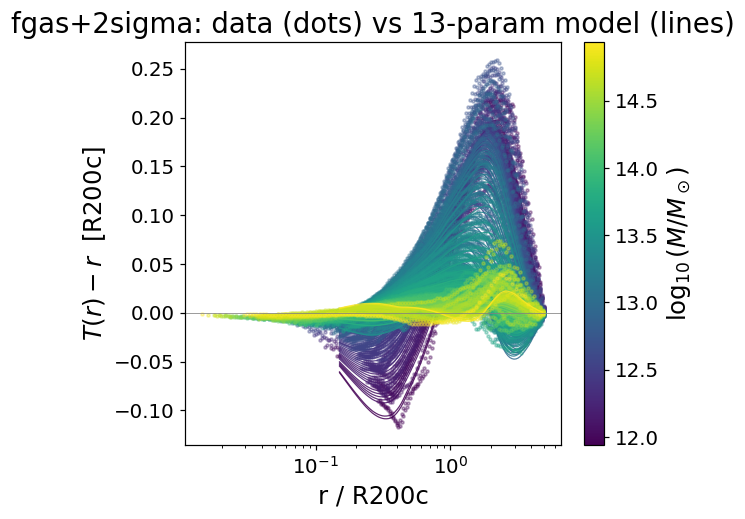

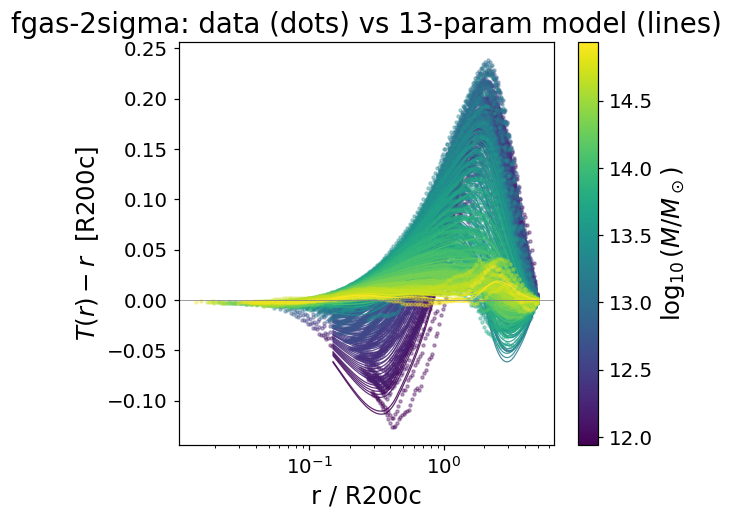

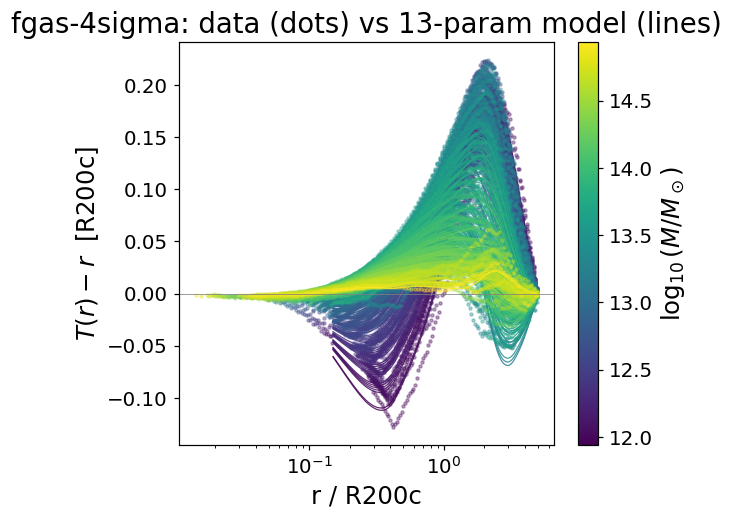

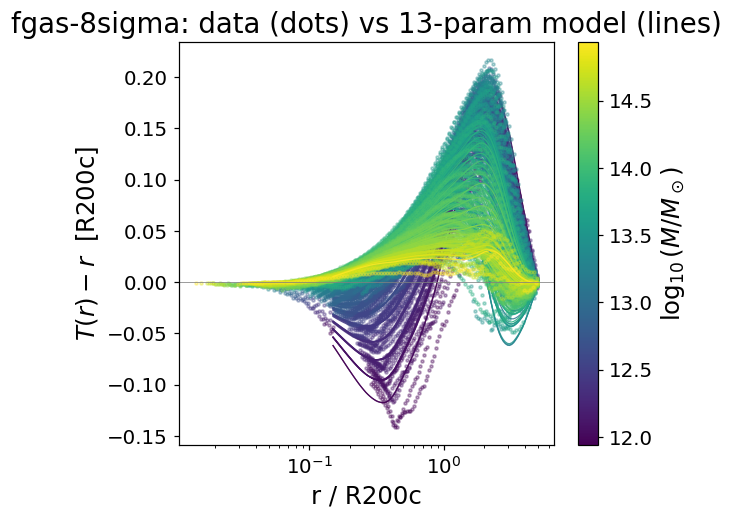

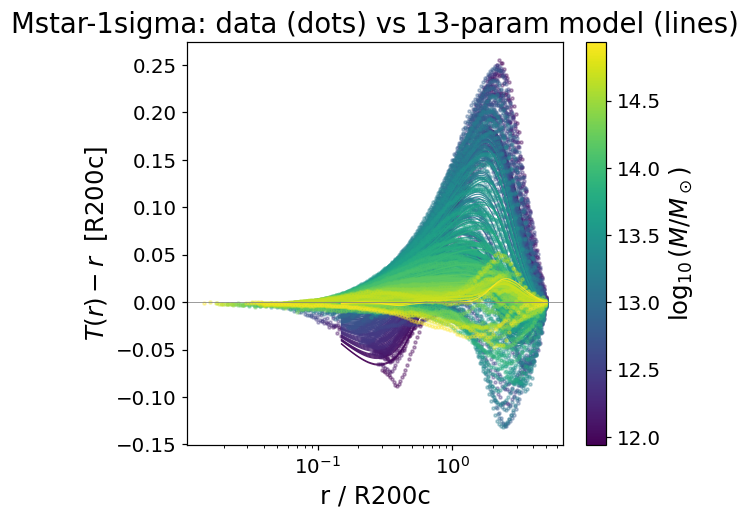

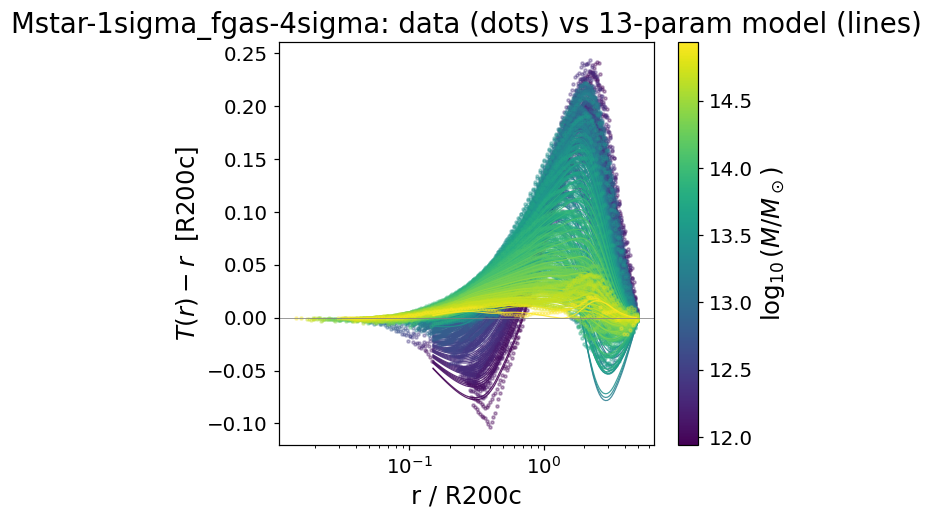

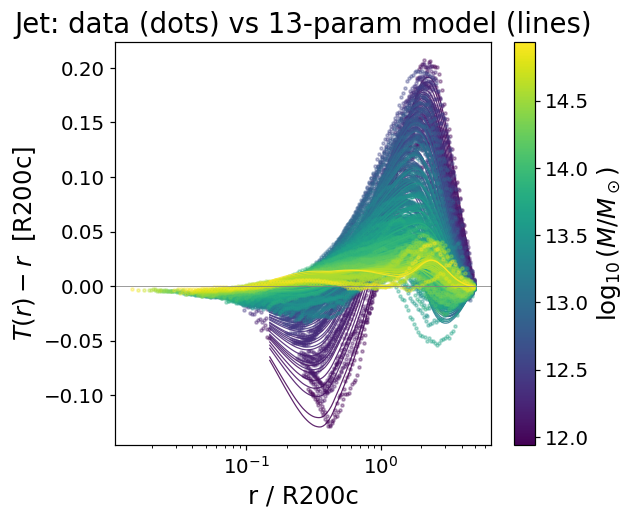

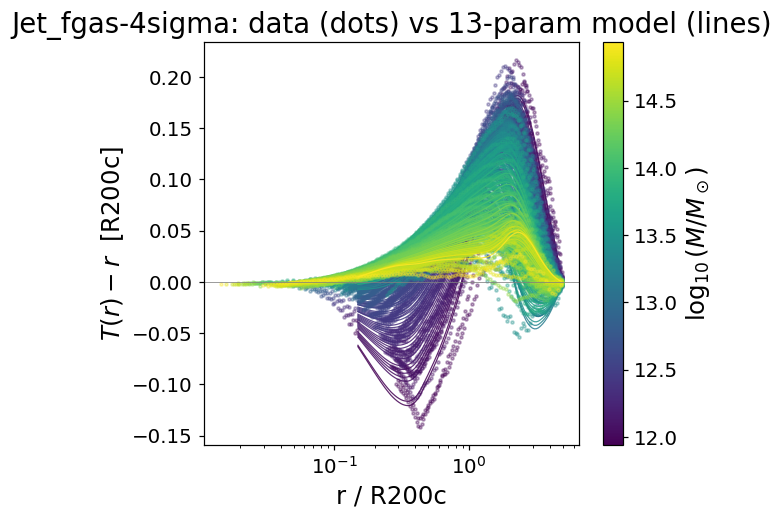

In [11]:
def plot_sim_overlay_fit(sim, bins_=bins_):
    rows = [b for b in bins_ if b["sim"] == sim]
    if not rows:
        print(f"no bins for {sim}"); return
    logM_all = [b["logM"] for b in rows]
    norm = mpl.colors.Normalize(vmin=min(logM_all), vmax=max(logM_all))
    cmap = mpl.cm.viridis

    fig, ax = plt.subplots(figsize=(6, 5))
    for b in sorted(rows, key=lambda b: b["logM"]):
        color = cmap(norm(b["logM"]))
        ax.plot(b["rc"], b["ot_amp"], "o", color=color, ms=2, alpha=.35)
        ax.plot(R_GRID, predict_curve(sim, b["logM"], b["z"]), "-", color=color, lw=.8, alpha=.85)
    ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
    ax.set_xlabel("r / R200c"); ax.set_ylabel(r"$T(r)-r$  [R200c]")
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    fig.colorbar(sm, ax=ax, label=r"$\log_{10}(M/M_\odot)$")
    ax.set_title(f"{sim}: data (dots) vs 13-param model (lines)")
    plt.tight_layout(); plt.show()

for sim in SIMS:
    plot_sim_overlay_fit(sim)

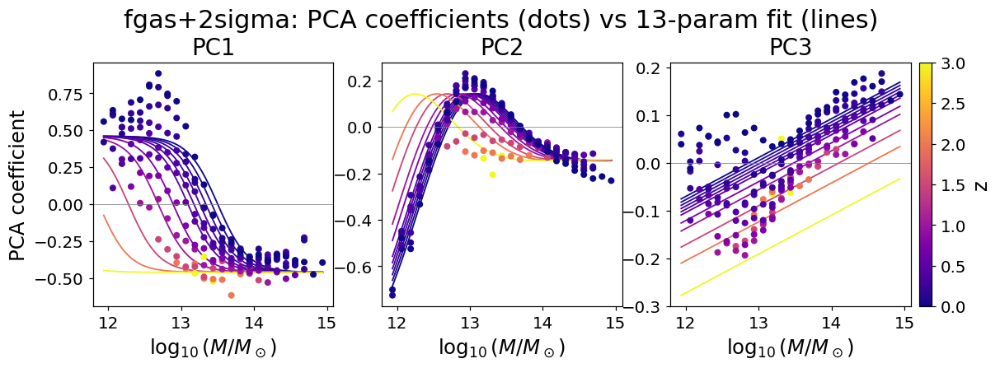

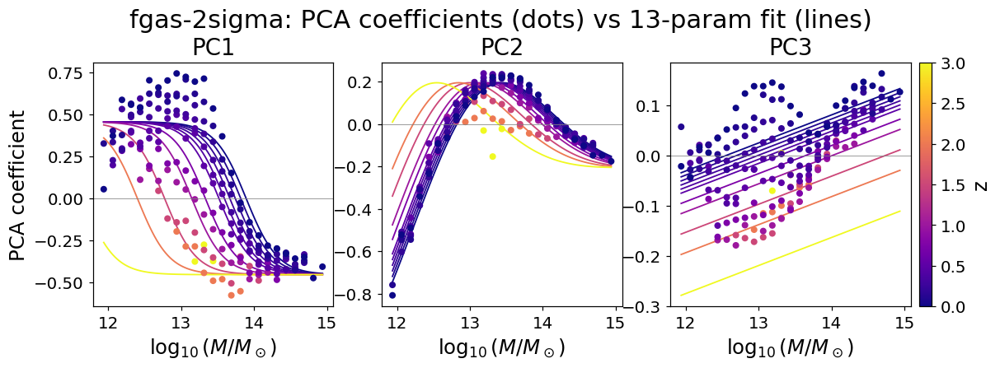

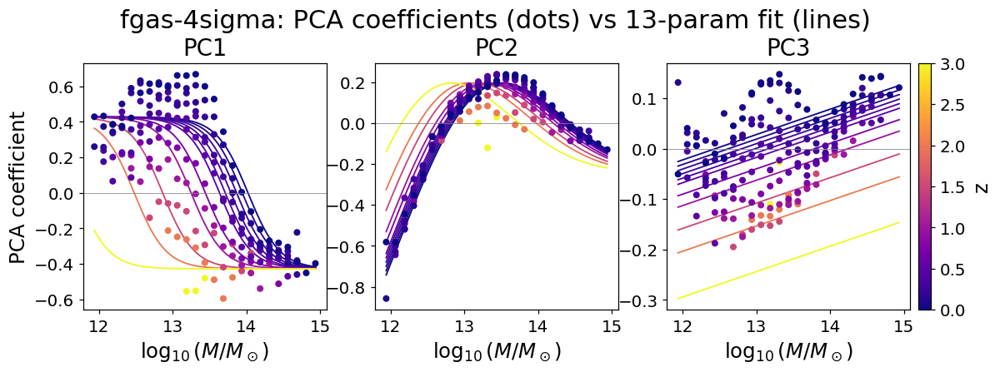

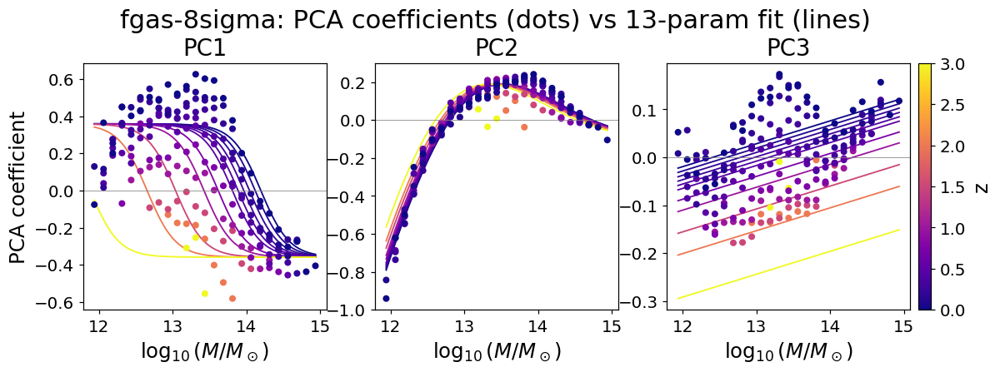

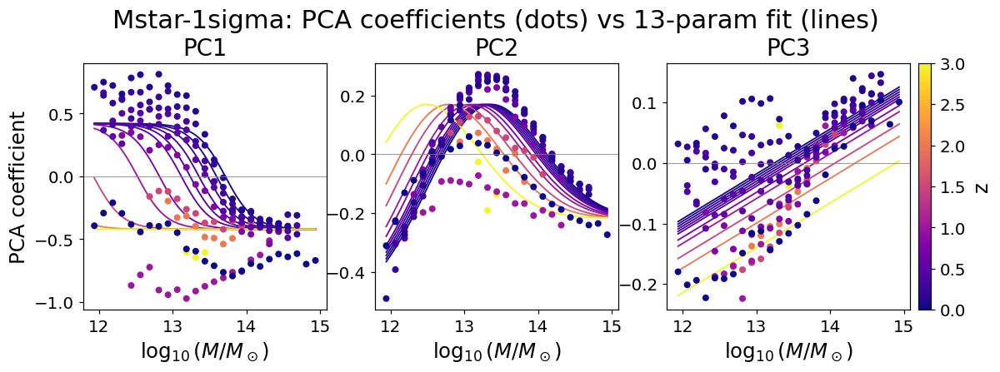

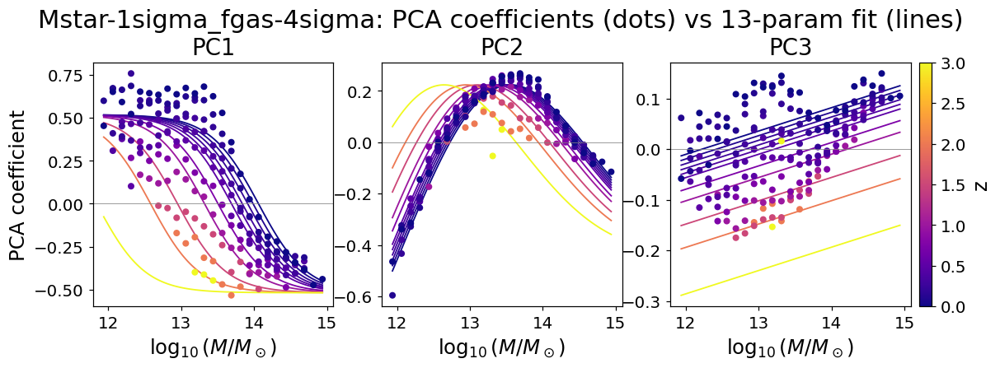

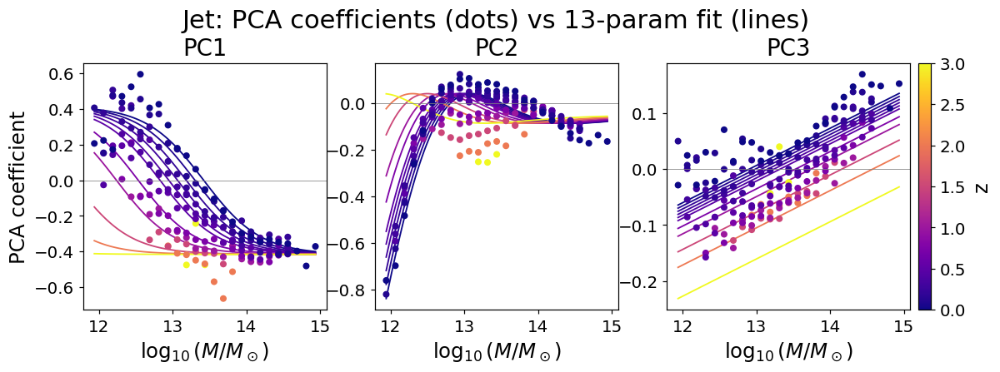

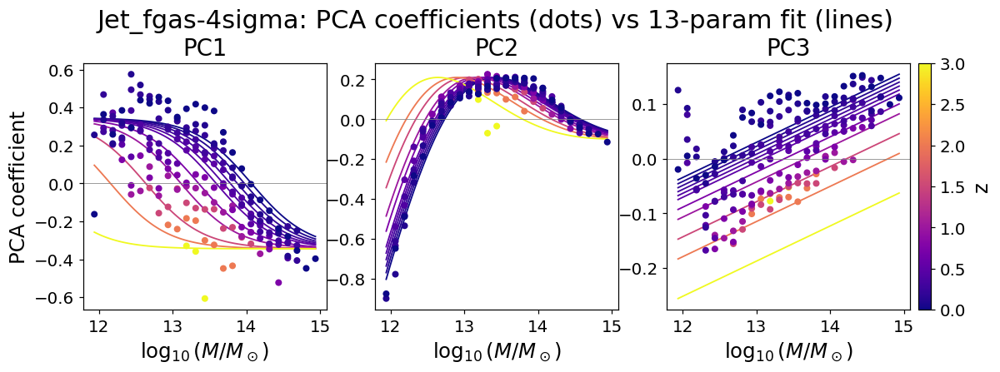

In [12]:
def plot_pca_fit_vs_mz(sim, meta=meta):
    sub = meta[meta.sim == sim]
    if sub.empty:
        print(f"no bins for {sim}"); return
    norm = mpl.colors.Normalize(vmin=sub.z.min(), vmax=sub.z.max())
    cmap = mpl.cm.plasma
    logM_grid = np.linspace(sub.logM.min(), sub.logM.max(), 100)
    fig, axes = plt.subplots(1, 3, figsize=(12, 3.5), sharex=True)
    for i, ax in enumerate(axes):
        sc = ax.scatter(sub.logM, sub[f"pc{i+1}"], c=sub.z, cmap=cmap, norm=norm, s=18, zorder=2)
        for z_val in sorted(sub.z.unique()):
            pcs = predict_pcs(sim, logM_grid, np.full_like(logM_grid, z_val))
            ax.plot(logM_grid, pcs[:, i], "-", color=cmap(norm(z_val)), lw=1.2, zorder=1)
        ax.set_xlabel(r"$\log_{10}(M/M_\odot)$"); ax.set_title(f"PC{i+1}")
        ax.axhline(0, color="gray", lw=.5)
    axes[0].set_ylabel("PCA coefficient")
    fig.colorbar(sc, ax=axes, pad=.01, fraction=.02, label="z")
    fig.suptitle(f"{sim}: PCA coefficients (dots) vs 13-param fit (lines)", y=1.05)
    plt.show()

for sim in SIMS:
    plot_pca_fit_vs_mz(sim)

## Bootstrap error vs. the fit

`bootstrap_v5.csv` gives a per-radius bootstrap std for every `status=="ok"` bin in v5 --
interpolated onto `R_GRID` the same way `X` is, so `(X - model) / STD_GRID` gives a per-radius,
per-bin number of sigma the data sits from the fit.

In [13]:
SIGMA_GREEN = 1.0
SIGMA_YELLOW = 2.0

boot_raw = pd.read_csv(f"{PATH}bootstrap_v5.csv")
boot_raw = boot_raw[boot_raw.sim.isin(SIMS)]

boot_lookup = {}
for (snap, sim, lo, hi), g in boot_raw.groupby(["snap", "sim", "lo", "hi"]):
    g = g.sort_values("r_idx")
    boot_lookup[(int(snap), sim, round(lo, 3), round(hi, 3))] = dict(
        rc=g["rc"].values, ot_std=g["ot_std_boot"].values)

def boot_std_native(b):
    key = (int(b["snap"]), b["sim"], round(b["lo"], 3), round(b["hi"], 3))
    return boot_lookup.get(key)

n_missing = sum(boot_std_native(b) is None for b in bins_)
print(f"{len(bins_) - n_missing} of {len(bins_)} modeled bins have a bootstrap match ({n_missing} missing)")

STD_GRID = np.full_like(X, np.nan)
for i, b in enumerate(bins_):
    bh = boot_std_native(b)
    if bh is None:
        continue
    STD_GRID[i] = np.interp(np.log(R_GRID), np.log(bh["rc"]), bh["ot_std"])

model_grid = np.zeros_like(X)
for sim in SIMS:
    mask = (meta.sim == sim).values
    pcs_pred = predict_pcs(sim, meta.loc[mask, "logM"].values, meta.loc[mask, "z"].values)
    model_grid[mask] = pca.inverse_transform(pcs_pred)

with np.errstate(divide="ignore", invalid="ignore"):
    sigma_dev = np.where(STD_GRID > 0, (X - model_grid) / STD_GRID, np.nan)
abs_dev = np.abs(sigma_dev)
valid = np.isfinite(abs_dev)

green = valid & (abs_dev <= SIGMA_GREEN)
yellow = valid & (abs_dev > SIGMA_GREEN) & (abs_dev <= SIGMA_YELLOW)
red = valid & (abs_dev > SIGMA_YELLOW)
print(f"\nper-radius-point classification, {valid.sum()} valid points ({len(bins_)} bins x {X.shape[1]} radii):")
print(f"  green (<={SIGMA_GREEN:g} sigma):  {green.sum():6d}  ({100*green.sum()/valid.sum():.1f}%)")
print(f"  yellow ({SIGMA_GREEN:g}-{SIGMA_YELLOW:g} sigma): {yellow.sum():6d}  ({100*yellow.sum()/valid.sum():.1f}%)")
print(f"  red (>{SIGMA_YELLOW:g} sigma):    {red.sum():6d}  ({100*red.sum()/valid.sum():.1f}%)  <- way from the fit")

1519 of 1519 modeled bins have a bootstrap match (0 missing)

per-radius-point classification, 151900 valid points (1519 bins x 100 radii):
  green (<=1 sigma):   45953  (30.3%)
  yellow (1-2 sigma):  36927  (24.3%)
  red (>2 sigma):     69020  (45.4%)  <- way from the fit


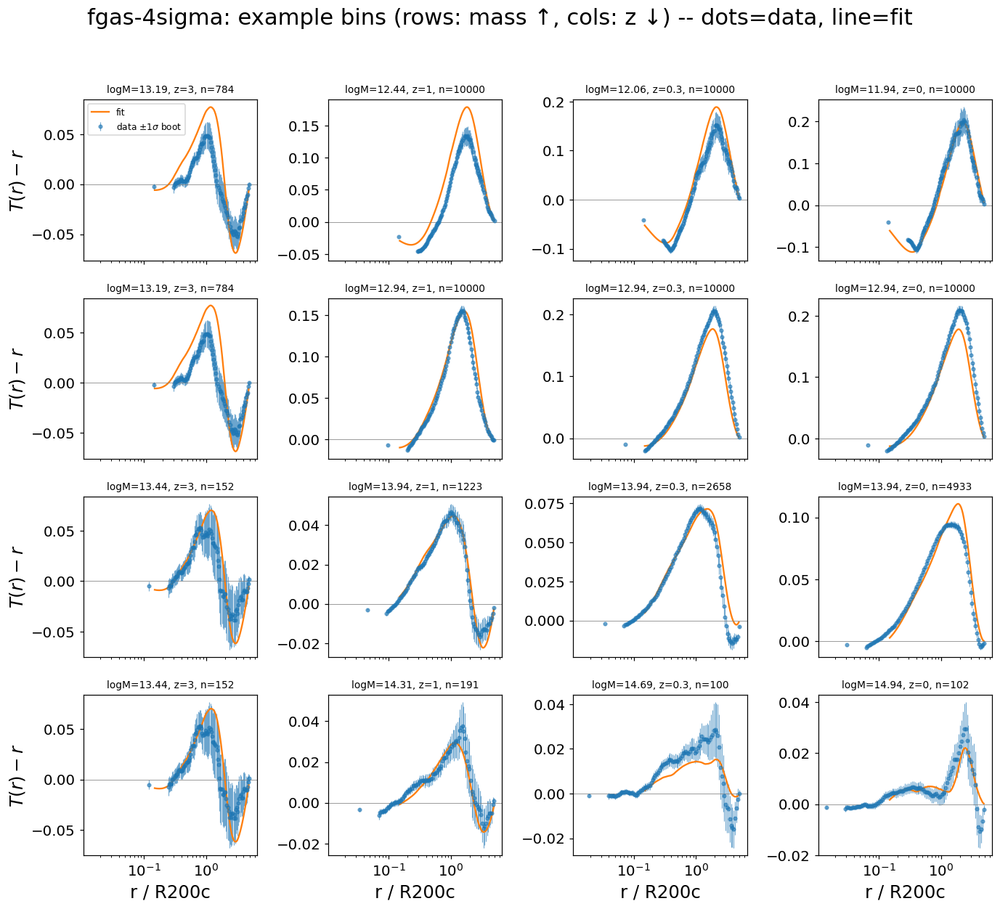

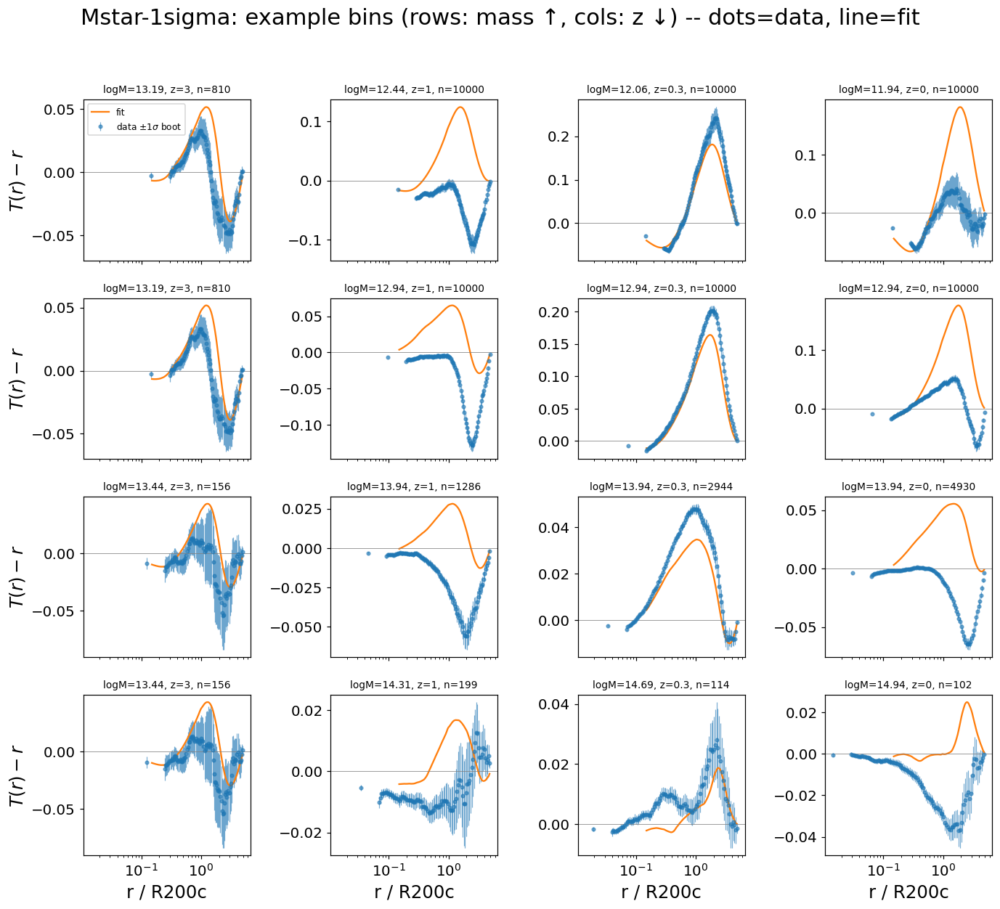

In [14]:
def plot_bin_examples(sim, n_mass=4, n_z=4, bins_=bins_):
    rows_sim = [b for b in bins_ if b["sim"] == sim]
    if not rows_sim:
        print(f"no bins for {sim}"); return

    zs = sorted({b["z"] for b in rows_sim}, reverse=True)
    z_targets = [zs[i] for i in sorted(set(np.linspace(0, len(zs) - 1, min(n_z, len(zs))).round().astype(int)))]
    masses = sorted({b["logM"] for b in rows_sim})
    m_targets = [masses[i] for i in sorted(set(np.linspace(0, len(masses) - 1, min(n_mass, len(masses))).round().astype(int)))]

    nrows, ncols = len(m_targets), len(z_targets)
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.2*ncols, 2.8*nrows), sharex=True)
    axes = np.atleast_2d(axes)
    for i, m_t in enumerate(m_targets):
        for j, z_t in enumerate(z_targets):
            ax = axes[i, j]
            cand = [b for b in rows_sim if b["z"] == z_t]
            if not cand:
                ax.axis("off"); continue
            b = min(cand, key=lambda b: abs(b["logM"] - m_t))
            bh = boot_std_native(b)
            if bh is not None:
                ax.errorbar(b["rc"], b["ot_amp"], yerr=bh["ot_std"], fmt="o", color="C0",
                            ms=3, alpha=.6, elinewidth=.8, capsize=0, label=r"data $\pm1\sigma$ boot")
            else:
                ax.plot(b["rc"], b["ot_amp"], "o", color="C0", ms=3, alpha=.6, label="data")
            ax.plot(R_GRID, predict_curve(sim, b["logM"], b["z"]), "-", color="C1", lw=1.5, label="fit")
            ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
            ax.set_title(f"logM={b['logM']:.2f}, z={b['z']:g}, n={b['n_halos']}", fontsize=9)
    for ax in axes[-1, :]:
        ax.set_xlabel("r / R200c")
    for ax in axes[:, 0]:
        ax.set_ylabel(r"$T(r)-r$")
    axes[0, 0].legend(fontsize=8)
    fig.suptitle(f"{sim}: example bins (rows: mass \u2191, cols: z \u2193) -- dots=data, line=fit", y=1.02)
    plt.tight_layout(); plt.show()

# fgas-4sigma (a good fit) alongside Mstar-1sigma (the known weak sim) for direct comparison
for sim in ["fgas-4sigma", "Mstar-1sigma"]:
    plot_bin_examples(sim)

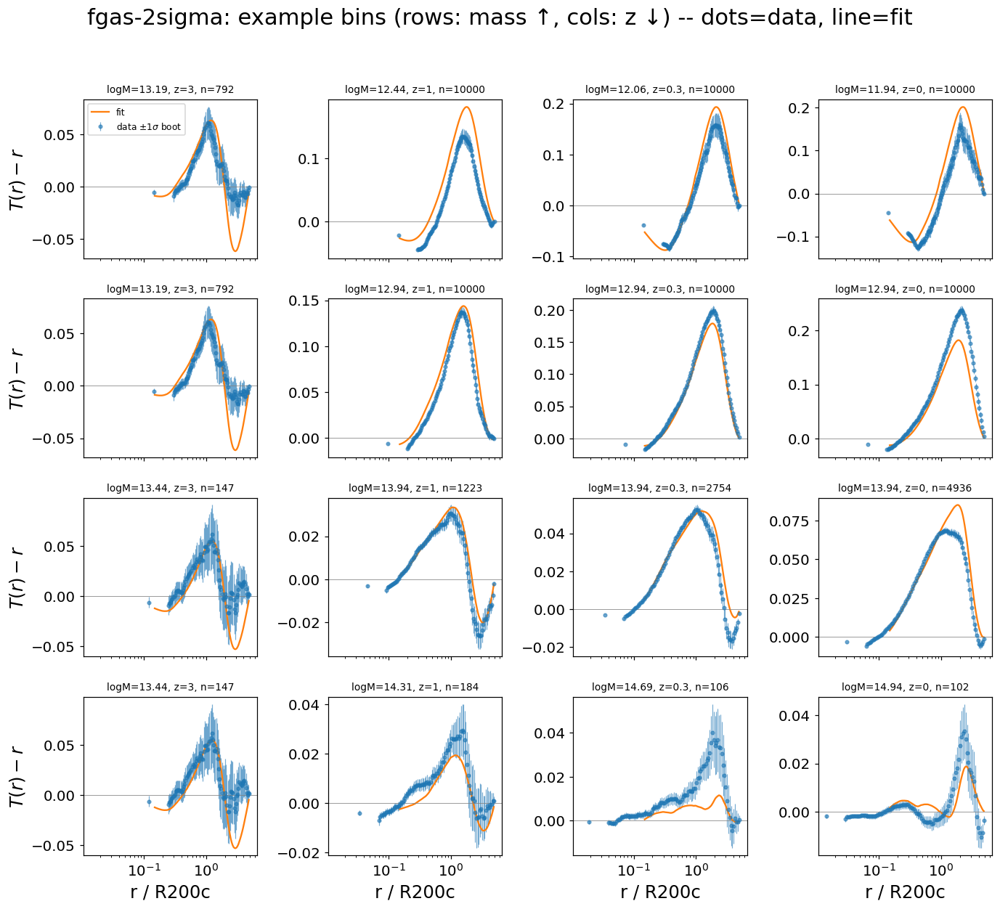

In [15]:
for sim in ["fgas-2sigma"]:
    plot_bin_examples(sim)

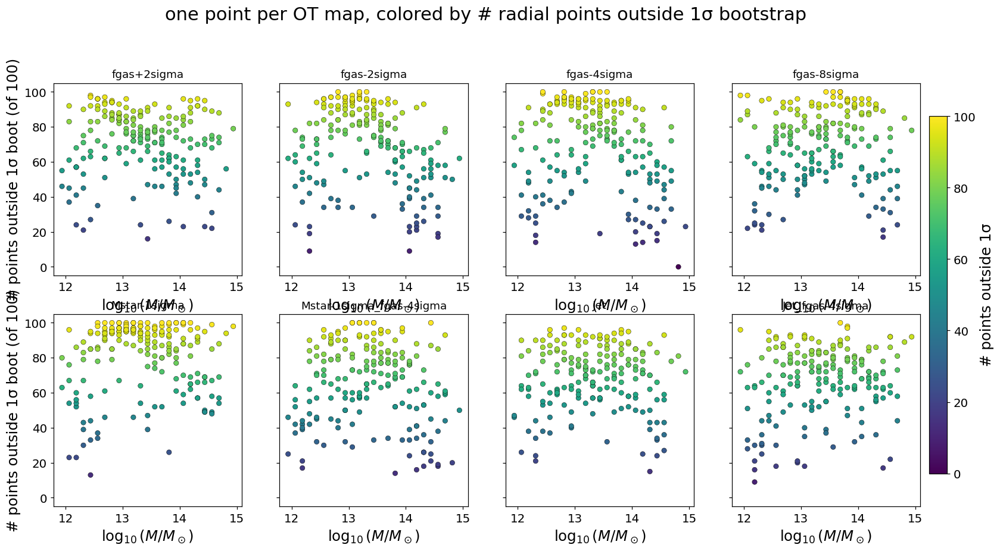

points outside 1 sigma per OT map (of 100 radial points/map): mean=69.7, median=73, max=100
1 of 1519 OT maps have every point within 1 sigma

per-sim breakdown (median # points/map outside 1 sigma):
sim
Mstar-1sigma_fgas-4sigma    69.0
Jet_fgas-4sigma             70.5
Jet                         71.0
fgas-2sigma                 72.0
fgas-8sigma                 73.0
fgas+2sigma                 74.0
fgas-4sigma                 74.0
Mstar-1sigma                88.0
Name: count_out, dtype: float64


In [16]:
count_out = (valid & (abs_dev > SIGMA_GREEN)).sum(axis=1)
has_any = valid.sum(axis=1) > 0

norm = mpl.colors.Normalize(vmin=0, vmax=count_out[has_any].max())
cmap = mpl.cm.viridis
fig, axes = plt.subplots(2, 4, figsize=(4.4*4, 4.2*2), sharey=True)
axes = axes.ravel()
for ax, sim in zip(axes, SIMS):
    mask = (meta.sim == sim).values & has_any
    sc = ax.scatter(meta.loc[mask, "logM"], count_out[mask], c=count_out[mask],
                     cmap=cmap, norm=norm, s=30, edgecolor="k", linewidth=.3)
    ax.set_xlabel(r"$\log_{10}(M/M_\odot)$"); ax.set_title(sim, fontsize=12)
for ax in axes[0::4]:
    ax.set_ylabel(f"# points outside {SIGMA_GREEN:g}\u03c3 boot (of {X.shape[1]})")
fig.colorbar(sc, ax=axes, pad=.01, fraction=.02, label=f"# points outside {SIGMA_GREEN:g}\u03c3")
fig.suptitle("one point per OT map, colored by # radial points outside 1\u03c3 bootstrap", y=1.02)
plt.show()

print(f"points outside {SIGMA_GREEN:g} sigma per OT map (of {X.shape[1]} radial points/map): "
      f"mean={count_out[has_any].mean():.1f}, median={np.median(count_out[has_any]):.0f}, "
      f"max={count_out[has_any].max()}")
print(f"{(count_out[has_any] == 0).sum()} of {has_any.sum()} OT maps have every point within 1 sigma")
print()
print("per-sim breakdown (median # points/map outside 1 sigma):")
print(meta.assign(count_out=count_out).groupby("sim").count_out.median().sort_values())

## OT map quality across (log M, z): bootstrap sigma vs. bin-placement sigma

For each bin, at each of the 100 radial points, `(data - model) / sigma` gives a number of
sigma the data sits from the fit. Plotted here as a (log M, z) map, one dot per bin, colored by
**how many of the 100 radial points fall outside 1 sigma** -- for two independent notions of
"sigma":

1. **Bootstrap sigma** (`STD_GRID`, already computed above): pure halo-count statistical noise
   at this exact bin placement.
2. **Bin-placement sigma**: how much the curve would change if the 0.125 dex mass-bin edges had
   been drawn slightly differently -- the std across the 4 quarter-bin-offset slides built in
   `slides_v5.ipynb` (`bootstrap_v5.csv` = offset 0, plus `bootstrap_slide_v5_{0.03125,0.0625,
   0.09375}.csv`), same idea as `demo_v5.ipynb`'s `bin_and_total_error`, just summarized per bin
   here instead of plotted as a curve.

In [17]:
SLIDE_OFFS = [0.03125, 0.0625, 0.09375]
slide_raw = {}
for off in SLIDE_OFFS:
    d = pd.read_csv(f"{PATH}bootstrap_slide_v5_{off:.5f}.csv", dtype={"snap": str})
    slide_raw[off] = d[d.sim.isin(SIMS)]

def nearest_curve_on_grid(df, snap, sim, target_mass, R_GRID=R_GRID):
    """closest-mass bin at this (snap, sim) in one slide offset's CSV, interpolated onto R_GRID."""
    sub = df[(df.snap == snap) & (df.sim == sim)]
    if sub.empty:
        return None
    sub = sub.assign(logM=(sub.lo + sub.hi) / 2)
    lo = sub.lo.iloc[(sub.logM - target_mass).abs().values.argmin()]
    g = sub[np.isclose(sub.lo, lo)].sort_values("rc")
    ot_disp = g.ot.values - g.rc.values
    return np.interp(np.log(R_GRID), np.log(g.rc.values), ot_disp)

BIN_STD_GRID = np.full_like(X, np.nan)
for i, b in enumerate(bins_):
    curves = [X[i]]  # offset 0 -- this bin's own curve, already on R_GRID
    for off in SLIDE_OFFS:
        c = nearest_curve_on_grid(slide_raw[off], b["snap"], b["sim"], b["logM"])
        if c is not None:
            curves.append(c)
    if len(curves) >= 2:
        BIN_STD_GRID[i] = np.array(curves).std(axis=0)

n_bin_missing = np.isnan(BIN_STD_GRID).all(axis=1).sum()
print(f"{len(bins_) - n_bin_missing} of {len(bins_)} bins have a bin-placement sigma "
      f"({n_bin_missing} missing -- no matching slide bin found)")

with np.errstate(divide="ignore", invalid="ignore"):
    sigma_dev_bin = np.where(BIN_STD_GRID > 0, (X - model_grid) / BIN_STD_GRID, np.nan)
abs_dev_bin = np.abs(sigma_dev_bin)

1519 of 1519 bins have a bin-placement sigma (0 missing -- no matching slide bin found)


/var/folders/t0/lct46439705461yqnjg81yhc0000gp/T/ipykernel_25965/1679333141.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(); plt.show()


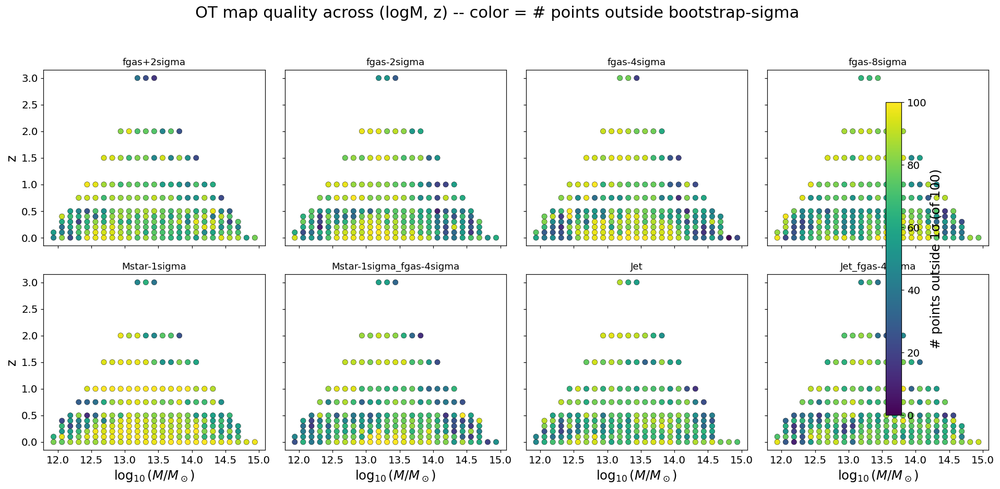

/var/folders/t0/lct46439705461yqnjg81yhc0000gp/T/ipykernel_25965/1679333141.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(); plt.show()


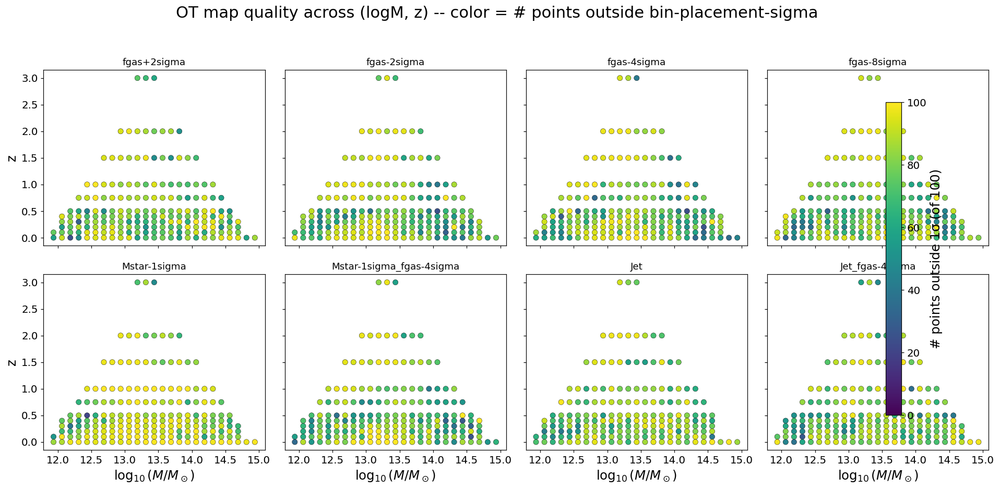

In [18]:
def plot_mz_count(count, has, title_suffix, meta=meta):
    """(logM, z), one dot per bin, color = # radial points outside sigma (of 100), fixed
    0-100 colorbar so different sims/sigma-definitions are directly comparable."""
    norm = mpl.colors.Normalize(vmin=0, vmax=X.shape[1])
    cmap = mpl.cm.viridis
    fig, axes = plt.subplots(2, 4, figsize=(4.4*4, 4.2*2), sharey=True, sharex=True)
    axes = axes.ravel()
    for ax, sim in zip(axes, SIMS):
        mask = (meta.sim == sim).values & has
        sc = ax.scatter(meta.loc[mask, "logM"], meta.loc[mask, "z"], c=count[mask],
                         cmap=cmap, norm=norm, s=45, edgecolor="k", linewidth=.3)
        ax.set_title(sim, fontsize=12)
    for ax in axes[4:]:
        ax.set_xlabel(r"$\log_{10}(M/M_\odot)$")
    for ax in axes[0::4]:
        ax.set_ylabel("z")
    fig.colorbar(sc, ax=axes, pad=.01, fraction=.02,
                 label=f"# points outside {SIGMA_GREEN:g}σ (of {X.shape[1]})")
    fig.suptitle(f"OT map quality across (logM, z) -- {title_suffix}", y=1.02)
    plt.tight_layout(); plt.show()

count_boot = (valid & (abs_dev > SIGMA_GREEN)).sum(axis=1)
plot_mz_count(count_boot, valid.sum(axis=1) > 0,
              "color = # points outside bootstrap-sigma")

count_bin = (np.isfinite(abs_dev_bin) & (abs_dev_bin > SIGMA_GREEN)).sum(axis=1)
plot_mz_count(count_bin, np.isfinite(abs_dev_bin).sum(axis=1) > 0,
              "color = # points outside bin-placement-sigma")

## Does the model's map actually reproduce the hydro histogram?

Everything above compares the OT *displacement* `T(r)-r` as an abstract, normalized curve. The
more direct test: take the actual DMO histogram (`avg_dmo`), push each mass element through the
model's predicted map `T_model(r) = r + model_amp(r)` -- mass-conserving redistribution via the
same `Func_for_fit.push_hist_monotone` the original pipeline uses -- and compare the resulting
predicted hydro histogram against the **actual** average hydro histogram (`avg_hyd`) from the
simulation.

**Not normalized.** `avg_dmo`/`avg_hyd` are stored as fractions (each sums to 1), which hides a
real signal: a halo's hydro `M200c` isn't the same as its DMO `M200c` (baryon feedback moves
mass across the `R200c` boundary). Both curves are rescaled by their own mean `M200c` here so
the y-axis is actual mass `[Msun]`, and the model's push-forward is rescaled by the **DMO**
mass specifically (since it conserves the DMO halo's total mass by construction) -- so any
visible gap between the dashed push-forward curve and the true hydro curve is real physics
(net mass gained/lost relative to `R200c`), not a normalization artifact.

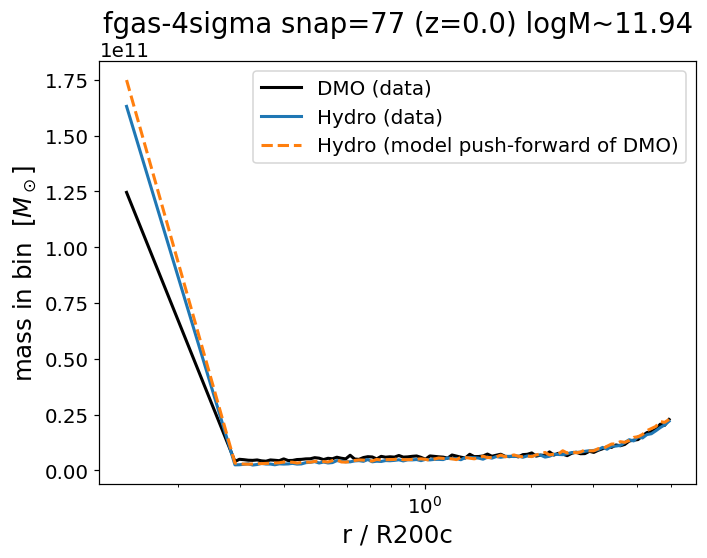

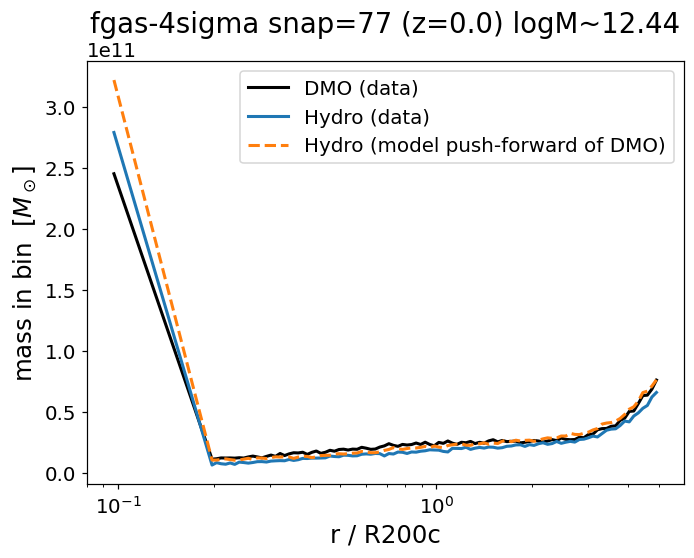

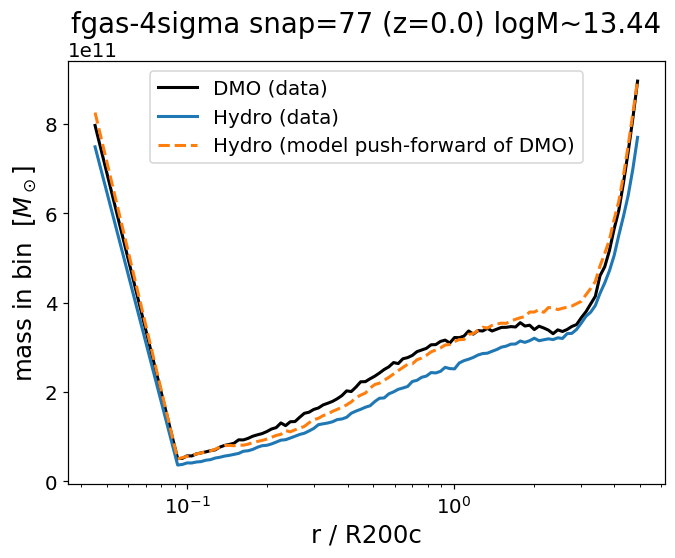

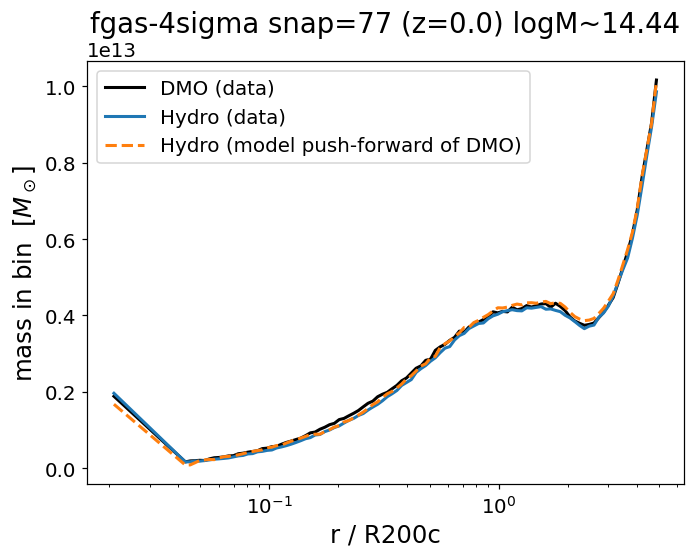

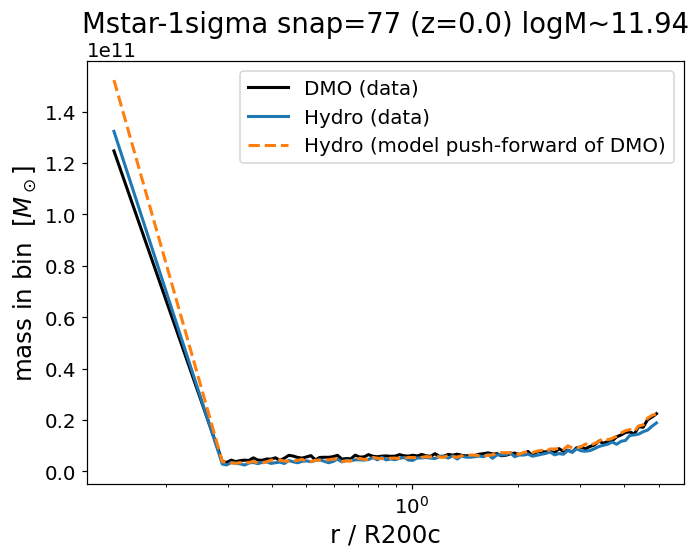

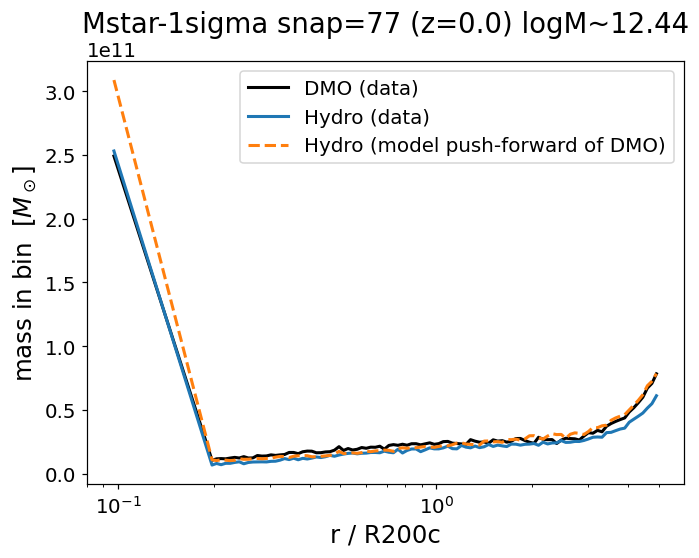

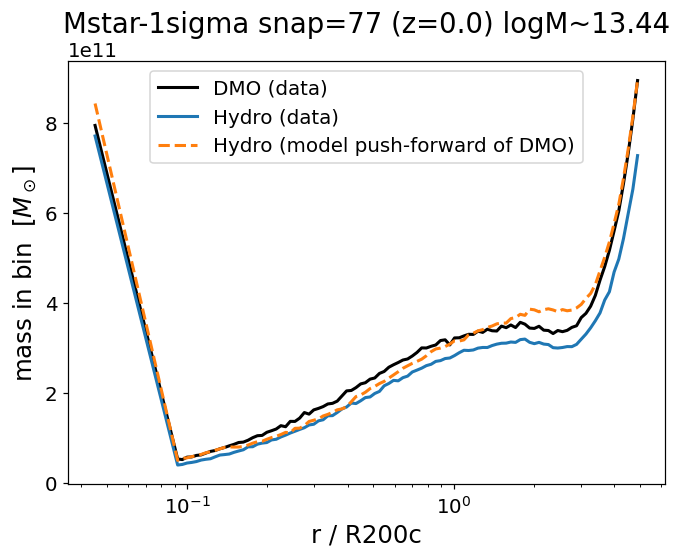

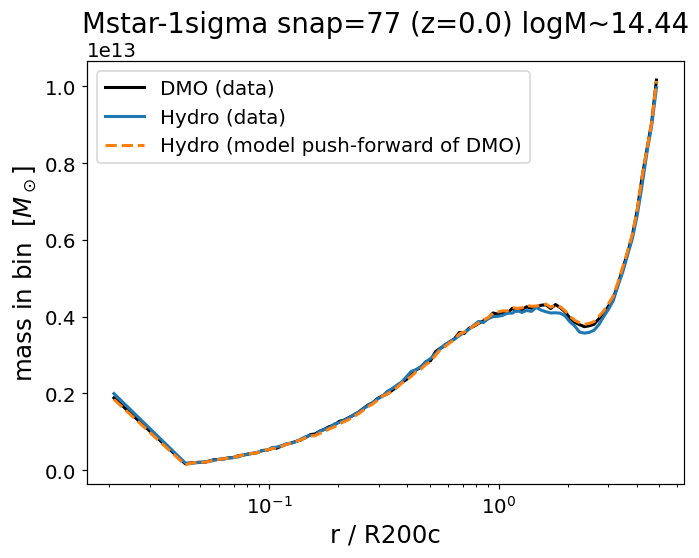

In [19]:
import sys
sys.path.insert(0, PATH)
import Func_for_fit as F

def load_hist(b, f=f5):
    # avg_dmo/avg_hyd are stored as fractions (sum to 1); mean(dmo_m200)/mean(hyd_m200) is the
    # mean per-halo M200c in this bin, used below to convert back to actual mass [Msun]
    key = f"{b['snap']}/{b['sim']}/{b['lo']:.3f}_{b['hi']:.3f}"
    g = f[key]
    m_dmo = float(np.mean(g["dmo_m200"][...]))
    m_hyd = float(np.mean(g["hyd_m200"][...]))
    return g["edges"][...], g["avg_dmo"][...], g["avg_hyd"][...], m_dmo, m_hyd

def model_T_native(sim, logM, z, r):
    """model's T(r) at ARBITRARY radii (incl. r=0, which push_hist_monotone needs) -- outside
    the trained [0.15, 4.85] range, the amplitude just holds flat (plain np.interp clamping)."""
    amp_grid = predict_curve(sim, logM, z)
    r = np.asarray(r, float)
    safe_r = np.clip(r, R_GRID[0], R_GRID[-1])
    amp = np.interp(np.log(safe_r), np.log(R_GRID), amp_grid)
    return r + np.where(r <= 0, 0.0, amp)

def predicted_hyd(sim, b, f=f5):
    """Un-normalized: avg_dmo/avg_hyd scaled by their own mean M200c to get actual mass
    [Msun] per radial bin, not a fraction. pred_hyd (the model's push-forward of avg_dmo) is
    scaled by the DMO mass, not the hydro mass -- it conserves the DMO halo's total mass by
    construction, so any gap vs. the true avg_hyd curve is real physics (baryonic mass loss/
    gain relative to R200c), not an artifact of comparing two different normalizations."""
    edges, avg_dmo, avg_hyd, m_dmo, m_hyd = load_hist(b, f)
    Te = lambda r: model_T_native(sim, b["logM"], b["z"], r)
    pred_hyd_frac = F.push_hist_monotone(edges, avg_dmo.copy(), Te)
    return edges, avg_dmo * m_dmo, avg_hyd * m_hyd, pred_hyd_frac * m_dmo

def plot_histogram_comparison(sim, snap, mass):
    cand = [b for b in bins_ if b["sim"] == sim and b["snap"] == snap]
    if not cand:
        print("no bins"); return
    b = min(cand, key=lambda b: abs(b["logM"] - mass))
    edges, avg_dmo, avg_hyd, pred_hyd = predicted_hyd(sim, b)
    rc_local = 0.5 * (edges[:-1] + edges[1:])

    plt.figure(figsize=(7, 5))
    plt.plot(rc_local, avg_dmo, color="k", lw=2, label="DMO (data)")
    plt.plot(rc_local, avg_hyd, color="C0", lw=2, label="Hydro (data)")
    plt.plot(rc_local, pred_hyd, "--", color="C1", lw=2, label="Hydro (model push-forward of DMO)")
    plt.xscale("log")
    plt.xlabel("r / R200c"); plt.ylabel(r"mass in bin  [$M_\odot$]")
    z = SNAP_Z.get(int(snap), np.nan)
    plt.title(f"{sim} snap={snap} (z={z}) logM~{b['logM']:.2f}")
    plt.legend()
    plt.show()

for mass in [11.5, 12.5, 13.5, 14.5]:
    plot_histogram_comparison("fgas-4sigma", "77", mass)
for mass in [11.5, 12.5, 13.5, 14.5]:
    plot_histogram_comparison("Mstar-1sigma", "77", mass)
